# Project Description

# Overview

Introduction:
    
In this capstone project, our objective is to develop machine learning models for rainfall weather forecasting in Australia. We will manipulate a dataset containing 10 years of daily weather observations from different locations in Australia.

By analyzing the historical weather data and applying various machine learning algorithms, we will design predictive models to classify instances as either "rain" or "no rain" and estimate the quantity of rainfall in millimeters. These models will provide valuable insights and aid in making informed decisions related to weather conditions.

Objectives:
The main objectives of this project are as follows:

1. Rainfall Prediction:
The first objective is to design a predictive model using machine learning algorithms to forecast whether or not it will rain tomorrow. This will involve analyzing the historical weather data and training a model to classify instances as either "rain" or "no rain" based on the available features.

2. Rainfall Amount Prediction:
The second objective is to design a predictive model using machine learning algorithms to predict the amount of rainfall that could occur. This task involves training a regression model that can estimate the quantity of rainfall (in millimeters) based on the given set of weather parameters.  

The project's outcomes might be contribute to improved planning and preparation for weather-related events, benefiting individuals, communities, and organizations in Australia. 
Additionally, this project will shed light on the important weather parameters that influence rainfall and enhance our understanding of the factors affecting Australia's climate patterns.

In [1]:
# Import Necessary Libraries

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
import xgboost as xgb
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RandomizedSearchCV
import joblib
pd.set_option('display.max_columns', None)

# Importing Dataset

Dataset Description:

The dataset which is used in this project to perform the tasks can be accessed from the following link: · https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv
· https://github.com/dsrscientist/dataset3

Columns Description:
The dataset used for this project contains approximately 10 years of daily weather observations from different locations in Australia. It includes various weather-related features such as temperature, rainfall, wind speed, humidity, and atmospheric pressure, among others.  

There is 23 features present in the dataset in which two columns will be Target variable. These features include:

1. Date: The date of observation.

2. Location: The common name of the weather station location.

3. MinTemp: The minimum temperature in degrees Celsius.

4. MaxTemp: The maximum temperature in degrees Celsius.

5. Rainfall: The amount of rainfall recorded for the day in millimeters.

6. Evaporation: Class A pan evaporation (mm) in the 24 hours to 9am.

7. Sunshine: The number of hours of bright sunshine in the day.

8. WindGustDir: The direction of the strongest wind gust in the 24 hours to midnight.

9. WindGustSpeed: The speed (km/h) of the strongest wind gust in the 24 hours to midnight.

10. WindDir9am: Direction of the wind at 9am.

11. WindDir3pm: Direction of the wind at 3pm.

12. WindSpeed9am: Wind speed (km/hr) averaged over 10 minutes prior to 9am.

13. WindSpeed3pm: Wind speed (km/hr) averaged over 10 minutes prior to 3pm.

14. Humidity9am: Humidity (percent) at 9am.

15. Humidity3pm: Humidity (percent) at 3pm.

16. Pressure9am: Atmospheric pressure (hPa) reduced to mean sea level at 9am.

17. Pressure3pm: Atmospheric pressure (hPa) reduced to mean sea level at 3pm.

18. Cloud9am: Fraction of sky obscured by cloud at 9am.

19. Cloud3pm: Fraction of sky obscured by cloud at 3pm.

20. Temp9am: Temperature (degrees Celsius) at 9am.

21. Temp3pm: Temperature (degrees Celsius) at 3pm.

22. RainToday: Boolean value (0 or 1) indicating if precipitation (mm) in the 24 hours to 9am exceeds 1mm.

23. RainTomorrow: The amount of next day rain in mm (the target variable).

In [2]:
df= pd.read_csv("weather_forecast")
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [3]:
df= df.drop(['Date'], axis= 1)
df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [4]:
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [5]:
df.tail()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,ESE,17.0,17.0,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


# Exploratory Data Analysis (EDA)

It is an approach to analyze the datasets, and summarize their characteristics. Here we are analyzing dataset by first checking with the dimensions of the dataset, then checking for the null values present in the dataset, followed by the memory usage detail by using info() function, checking with value counts and unique values present in dataset, followed by statistical summary of dataset(numerical column), which ends with graphical analysis.

Let's start with checking the dimension of the dataset using df.shape attribute, then we will be seeing df.columns and df.dtypes attributes to check the columns and their datatypes, which will be followed by isnull().sum() function which will check the missing data present in each column of the dataset. We will also visualize the null values using heatmap to clear the confusion. And then we will be describing the statistical summary by using df.describe() function.

In [6]:
df.shape

(8425, 22)

In [7]:
df.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [8]:
df.dtypes

Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

As we can see two different types of datatypes are present i.e., float64(16), object(6). 

In [9]:
# Let's Check the NaN values present in each column

df.isnull().sum()

Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

Lets use fillna(), to fill missing values. Here we will be using mode for all object datatype and mean for numerical columns.

In [10]:
# Filling missing values of categorical columns

df['WindGustDir'].fillna(df['WindGustDir'].mode()[0], inplace= True)
df['WindDir9am'].fillna(df['WindDir9am'].mode()[0], inplace= True)
df['WindDir3pm'].fillna(df['WindDir3pm'].mode()[0], inplace= True)
df['RainToday'].fillna(df['RainToday'].mode()[0], inplace= True)
df['RainTomorrow'].fillna(df['RainTomorrow'].mode()[0], inplace= True)

# Filling missing values of numerical columns
df['MinTemp'].fillna(df['MinTemp'].mean(), inplace= True)
df['MaxTemp'].fillna(df['MaxTemp'].mean(), inplace= True)
df['Rainfall'].fillna(df['Rainfall'].mean(), inplace= True)
df['Evaporation'].fillna(df['Evaporation'].mean(), inplace= True)
df['Sunshine'].fillna(df['Sunshine'].mean(), inplace= True)
df['WindGustSpeed'].fillna(df['WindGustSpeed'].mean(), inplace= True)
df['WindSpeed9am'].fillna(df['WindSpeed9am'].mean(), inplace= True)
df['WindSpeed3pm'].fillna(df['WindSpeed3pm'].mean(), inplace= True)
df['Humidity9am'].fillna(df['Humidity9am'].mean(), inplace= True)
df['Humidity3pm'].fillna(df['Humidity3pm'].mean(), inplace= True)
df['Pressure9am'].fillna(df['Pressure9am'].mean(), inplace= True)
df['Pressure3pm'].fillna(df['Pressure3pm'].mean(), inplace= True)
df['Cloud9am'].fillna(df['Cloud9am'].mean(), inplace= True)
df['Cloud3pm'].fillna(df['Cloud3pm'].mean(), inplace= True)
df['Temp9am'].fillna(df['Temp9am'].mean(), inplace= True)
df['Temp3pm'].fillna(df['Temp3pm'].mean(), inplace= True)

In [11]:
df.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

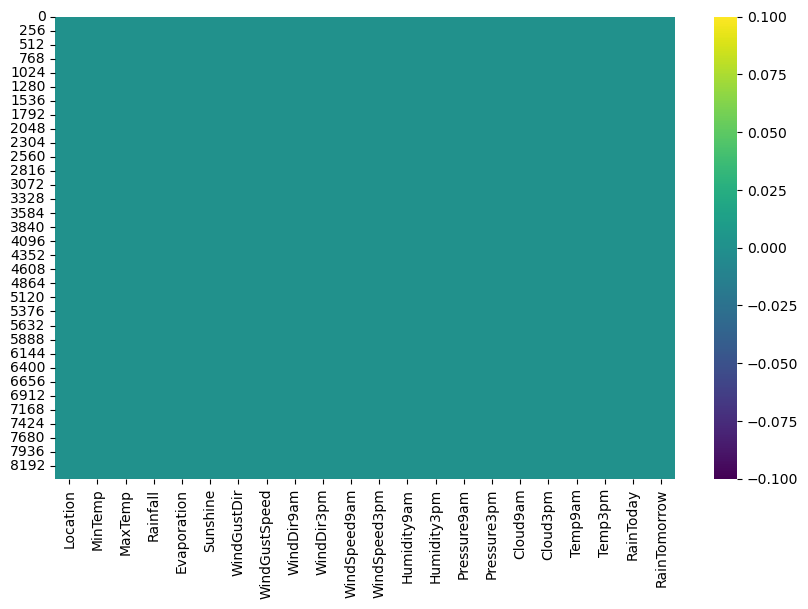

In [12]:
# Visualize the null values through heatmap

plt.figure(figsize= (10,6))
sns.heatmap(df.isnull(), cmap= 'viridis')
plt.show()

As we can see no null values present now.

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       8425 non-null   object 
 1   MinTemp        8425 non-null   float64
 2   MaxTemp        8425 non-null   float64
 3   Rainfall       8425 non-null   float64
 4   Evaporation    8425 non-null   float64
 5   Sunshine       8425 non-null   float64
 6   WindGustDir    8425 non-null   object 
 7   WindGustSpeed  8425 non-null   float64
 8   WindDir9am     8425 non-null   object 
 9   WindDir3pm     8425 non-null   object 
 10  WindSpeed9am   8425 non-null   float64
 11  WindSpeed3pm   8425 non-null   float64
 12  Humidity9am    8425 non-null   float64
 13  Humidity3pm    8425 non-null   float64
 14  Pressure9am    8425 non-null   float64
 15  Pressure3pm    8425 non-null   float64
 16  Cloud9am       8425 non-null   float64
 17  Cloud3pm       8425 non-null   float64
 18  Temp9am 

In [14]:
# Let's looping through each column to get value counts

for col in df.columns:
    print("Value counts for{col}:")
    print(df[col].value_counts())

Value counts for{col}:
Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64
Value counts for{col}:
 13.193305    75
 12.000000    74
 13.200000    71
 13.800000    69
 12.700000    68
              ..
-1.100000      1
 1.400000      1
-1.400000      1
-1.700000      1
 26.000000     1
Name: MinTemp, Length: 286, dtype: int64
Value counts for{col}:
19.0    87
23.8    75
19.8    74
25.0    71
22.3    68
        ..
8.2      1
10.3     1
39.7     1
9.4      1
43.5     1
Name: MaxTemp, Length: 332, dtype: int64
Value counts for{col}:
0.000000      5299
0.200000       406
2.805913       240
0.400000       177
0.600000       116
              ... 
61.200000        1
128.000000       1
90.000000        1
34.400000        1
40.000000        1
Name: Rainfall, Length: 251,

In [15]:
# loop through each column to get unique values
for col in df.columns:
    print("Unique values in {col}:")
    print(df[col].unique())

Unique values in {col}:
['Albury' 'CoffsHarbour' 'Newcastle' 'Penrith' 'Williamtown' 'Wollongong'
 'Melbourne' 'Brisbane' 'Adelaide' 'PerthAirport' 'Darwin' 'Uluru']
Unique values in {col}:
[13.4         7.4        12.9         9.2        17.5        14.6
 14.3         7.7         9.7        13.1        15.9        12.6
  8.4         9.8        14.1        13.5        11.2        11.5
 17.1        20.5        15.3        16.2        16.9        20.1
 19.7        12.5        12.         11.3         9.6        10.5
 12.3        13.7        16.1        14.         17.         17.3
 17.2        17.4        19.8        14.9        13.9        18.6
 19.3        24.4        18.8        20.8        15.7        18.5
 20.4        21.8        22.3        22.         28.         21.5
 21.7        23.5        28.3        18.4        12.4        13.3
 18.         18.7        15.5         8.9        15.         15.4
 16.         12.8        13.2        13.8         7.6         8.3
 11.         20.9 

# Description Of Data

In [16]:
# Statistical Summary of Numerical Columns

df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934
std,5.379488,6.114516,10.309308,3.852004,2.825451,13.776101,10.128579,9.704759,16.774231,18.311894,6.275759,6.217451,2.429205,2.299419,5.608301,5.945849
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.300000,19.300000,0.000000,4.000000,7.632205,31.000000,6.000000,11.000000,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000
50%,13.200000,23.300000,0.000000,5.389395,7.632205,40.174469,13.000000,19.000000,68.000000,51.000000,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.000000
75%,17.300000,28.000000,1.400000,5.389395,8.900000,48.000000,20.000000,24.000000,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


This statistical summary of numerical columns include the count, mean, standard deviation, minimum value, 25th percentile (Q1), median (50th percentile or Q2), 75th percentile (Q3), and maximum value for each variable.

Here's a breakdown of the summary:

1. count: The number of non-missing values for each feature. It indicates that we have 8,425 observations for each of the listed features.

2. mean: The average value of each feature across all the observations. 

3. std: The standard deviation, which measures the dispersion or variability of each feature. It gives an indication of how much the values deviate from the mean. Larger standard deviations indicate greater variability in the data.

4. min: The minimum value observed for each feature. 

5. 25%: The 25th percentile, also known as the first quartile. It represents the value below which 25% of the data falls. 

6. 50%: The 50th percentile, also known as the median. It represents the middle value of the dataset. 

7. 75%: The 75th percentile, also known as the third quartile. It represents the value below which 75% of the data falls. 

8. max: The maximum value observed for each feature. 

These statistics will be providing an overview of the distribution and range of values for each numerical feature in your dataset. They will be useful for understanding the central tendency, spread, and potential outliers in the data.

#  Data Visualization- Graphical Analysis

 Here we will be performing data visualization techniques like Univariate, Bivariate , and Multivariate analysis to visually explore and analyze the data. It will helps us in gaining the insights into the patterns,distribution, and relatioship present in dataset. For plotting different graphs we wil be import seaborn and matplotlib Python libraries. By creating various plots, we can easly visualize the data.



Univariate Analysis:

Here, to perform univariate analysis in numerical column we will be using Histogram plot, Density plot,and boxplot. Using a bar plot to each categorical column and will see the distribution, skewness and presence of outliers in the data present in each columns.

Categorical Columns

1. 'Location'

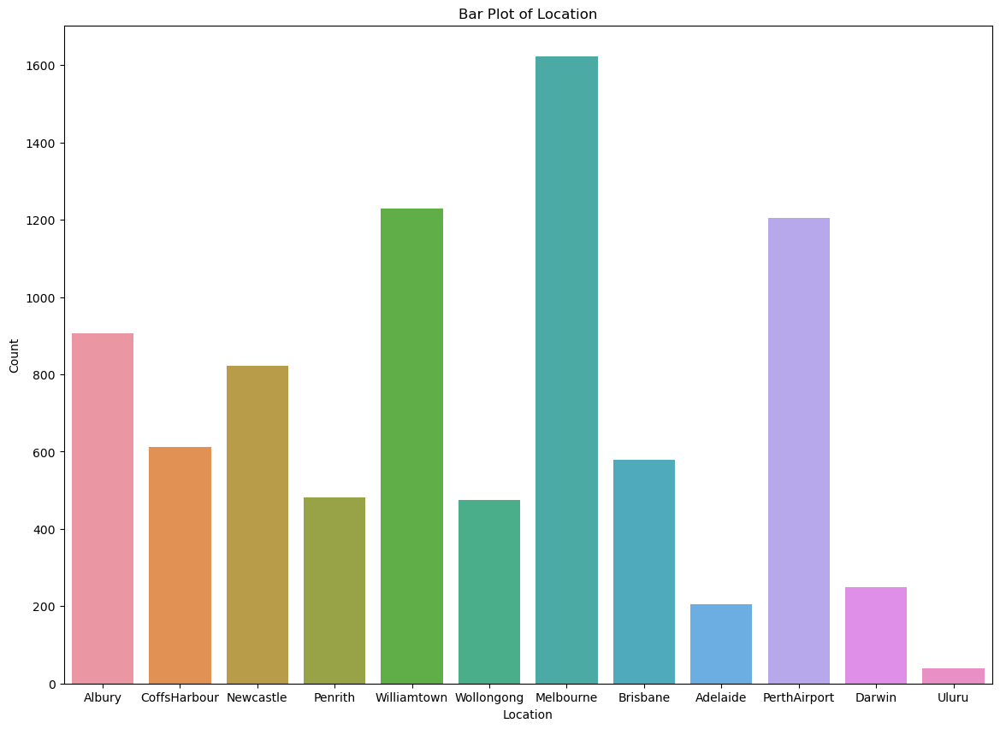

In [17]:
# Let's visualize the 'Location' column by bar plot

plt.figure(figsize=(14,10))
sns.countplot(x='Location', data=df)
plt.xlabel('Location')
plt.ylabel('Count')
plt.title('Bar Plot of Location')
plt.show()

Here we can see observation count from Melbourne is the highest followed by Williamtown.

2. 'WindGustDir'

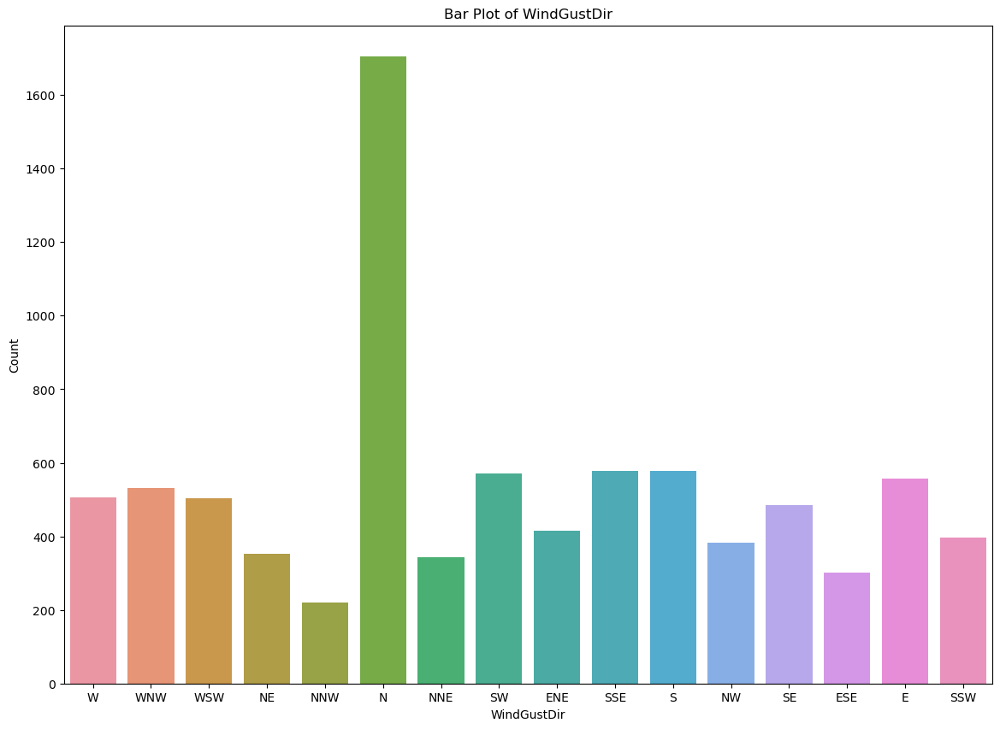

In [18]:
# Let's visualize the 'WindGustDir' column by bar plot

plt.figure(figsize=(14,10))
sns.countplot(x='WindGustDir', data=df)
plt.xlabel('WindGustDir')
plt.ylabel('Count')
plt.title('Bar Plot of WindGustDir')
plt.show()

Here we can see the observation count from North is the highest.

3. 'WindDir9am'

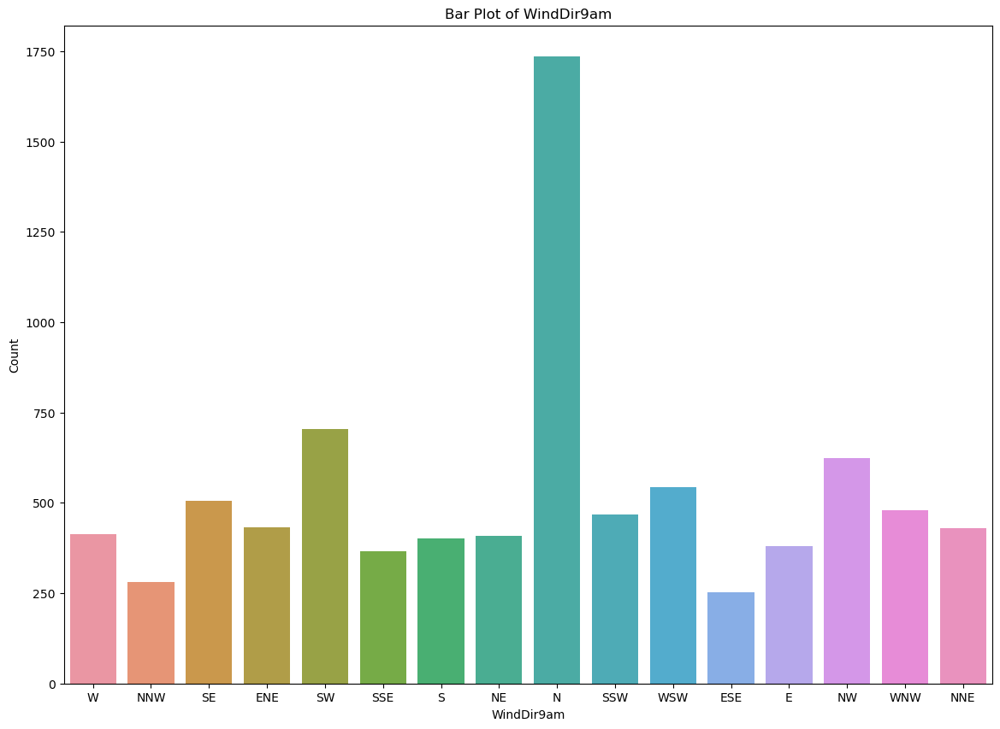

In [19]:
# Let's visualize the 'WindDir9am' column by bar plot

plt.figure(figsize=(14,10))
sns.countplot(x='WindDir9am', data=df)
plt.xlabel('WindDir9am')
plt.ylabel('Count')
plt.title('Bar Plot of WindDir9am')
plt.show()

4. 'WindDir3pm'

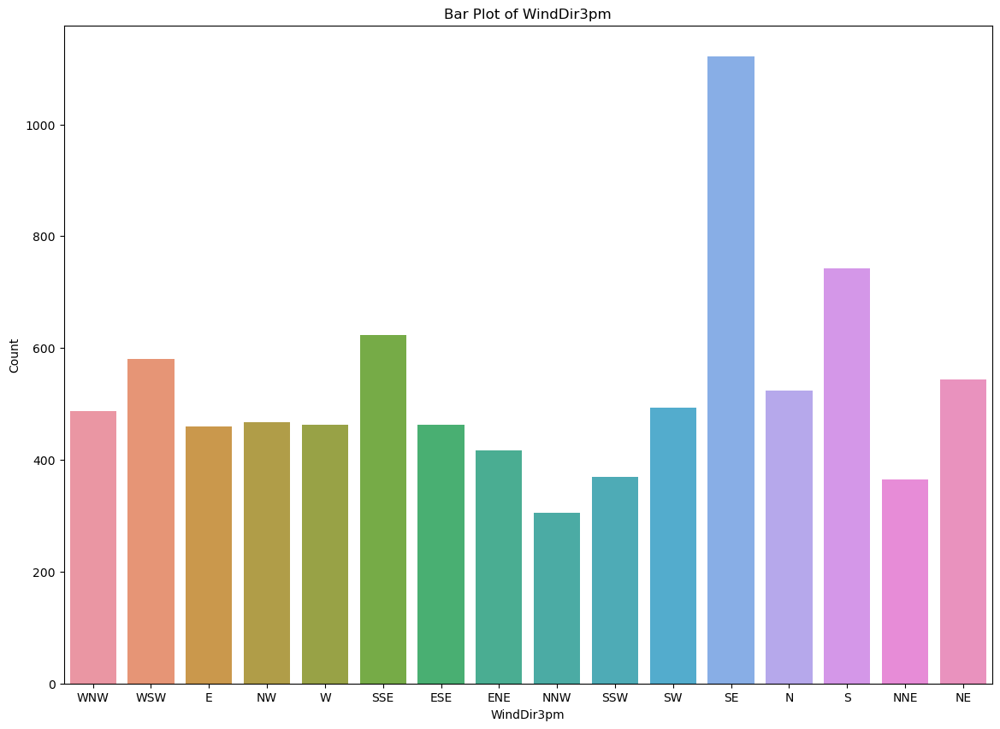

In [20]:
# Let's visualize the 'WindDir3pm' column by bar plot

plt.figure(figsize=(14,10))
sns.countplot(x='WindDir3pm', data=df)
plt.xlabel('WindDir3pm')
plt.ylabel('Count')
plt.title('Bar Plot of WindDir3pm')
plt.show()

5. 'RainToday'

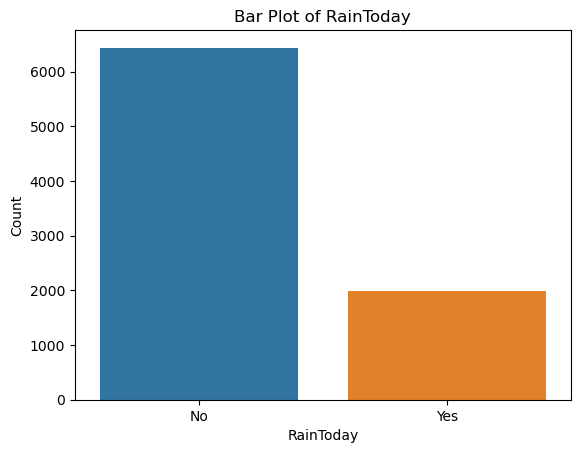

In [21]:
# Let's visualize the 'RainToday' column by bar plot

sns.countplot(x='RainToday', data=df)
plt.xlabel('RainToday')
plt.ylabel('Count')
plt.title('Bar Plot of RainToday')
plt.show()

6. 'RainTomorrow'

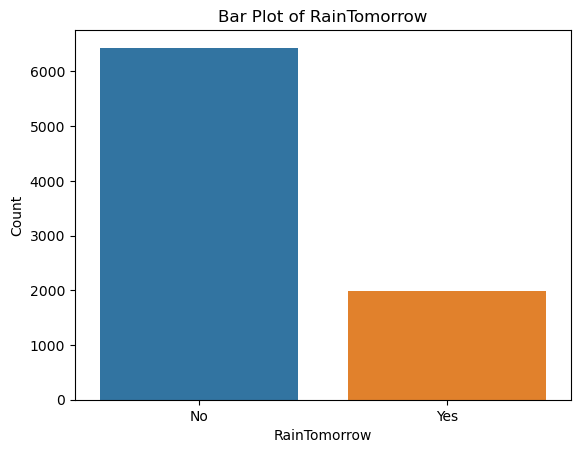

In [22]:
# Let's visualize the 'RainTomorrow' column by bar plot

sns.countplot(x='RainTomorrow', data=df)
plt.xlabel('RainTomorrow')
plt.ylabel('Count')
plt.title('Bar Plot of RainTomorrow')
plt.show()

Numerical Columns

1. 'MinTemp'

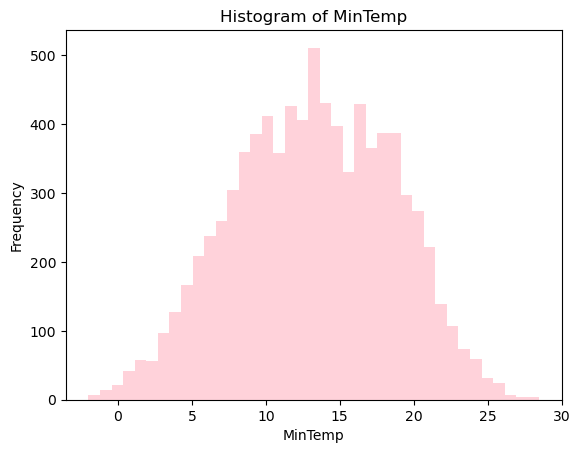

In [23]:
# Let's analyze the 'MinTemp' column by using histogram plot

plt.hist(df['MinTemp'], bins= 'auto', color= 'pink', alpha=0.7)
plt.xlabel('MinTemp')
plt.ylabel('Frequency')
plt.title('Histogram of MinTemp')
plt.show()

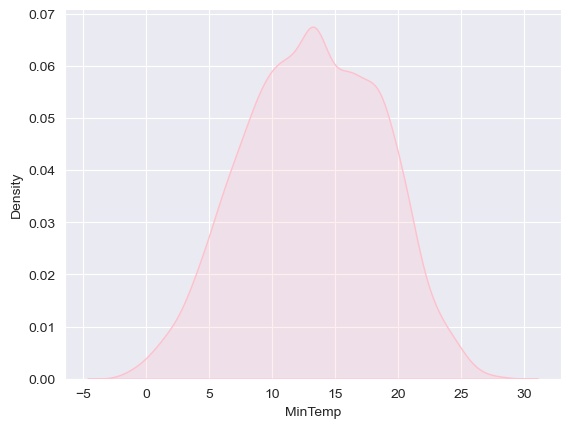

In [24]:
# Now let's analyze the 'MinTemp' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["MinTemp"], shade=True, color='pink')
plt.show()

Here we can analyze symmetrical distribution of data in the column, with peak in between 10-15. 

2. 'MaxTemp'

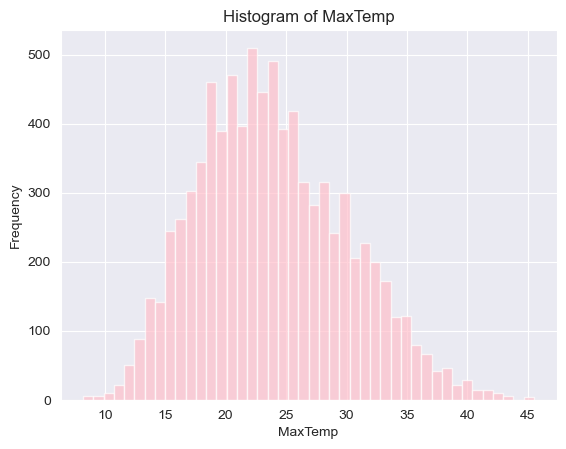

In [25]:
# Let's analyze the 'MaxTemp' column by using histogram plot

plt.hist(df['MaxTemp'], bins= 'auto', color= 'pink', alpha=0.7)
plt.xlabel('MaxTemp')
plt.ylabel('Frequency')
plt.title('Histogram of MaxTemp')
plt.show()

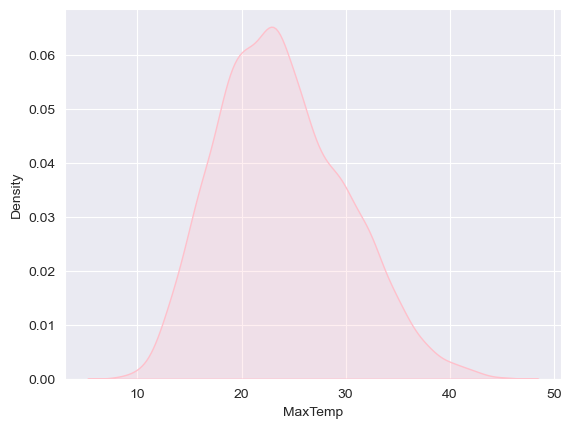

In [26]:
# Now let's analyze the 'MaxTemp' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["MaxTemp"], shade=True, color='pink')
plt.show()

As we can analyze that the distribution is slightly right skewed with peak is around 23.

3. 'Rainfall'

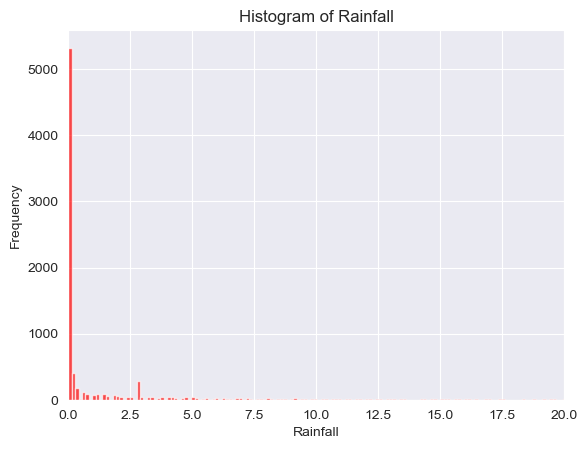

In [27]:
# Let's analyze the 'Rainfall' column by using histogram plot

plt.hist(df['Rainfall'], bins= 'auto', color= 'red', alpha=0.7)
plt.xlabel('Rainfall')
plt.ylabel('Frequency')
plt.title('Histogram of Rainfall')
plt.xlim(0,20)
plt.show()

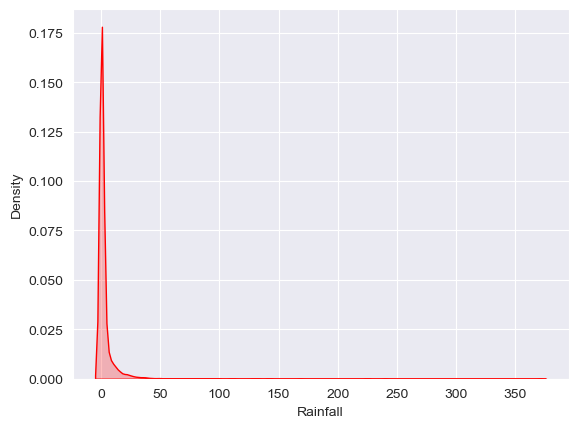

In [28]:
# Now let's analyze the 'Rainfall' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["Rainfall"], shade=True, color='red')
plt.show()

As we can see in the analysis plot that distribution is heavely skewed to right with the peak value is at 0.

4. 'Evaporation'

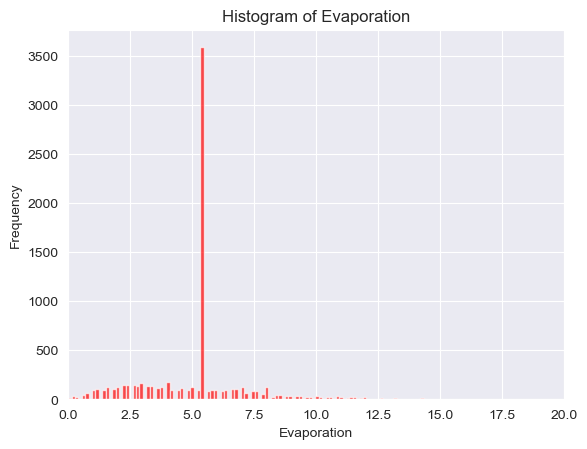

In [29]:
# Let's analyze the 'Evaporation' column by using histogram plot

plt.hist(df['Evaporation'], bins= 'auto', color= 'red', alpha=0.7)
plt.xlabel('Evaporation')
plt.ylabel('Frequency')
plt.title('Histogram of Evaporation')
plt.xlim(0,20)
plt.show()

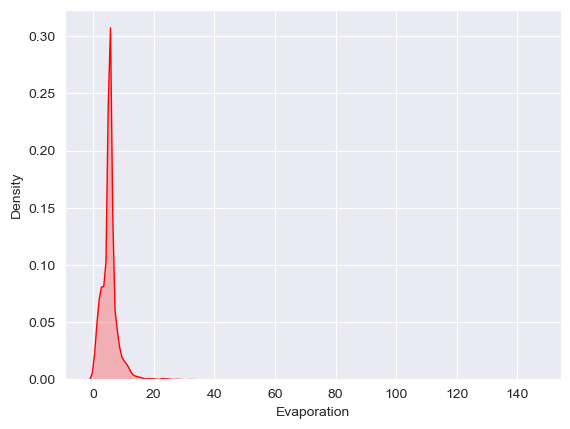

In [30]:
# Now let's analyze the 'Evaporation' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["Evaporation"], shade=True, color='red')
plt.show()

As we can see here in analysis plot that distribution is heavely skewed to right with a peak in between 0-2-, as maximum values lies there.

5. 'Sunshine'

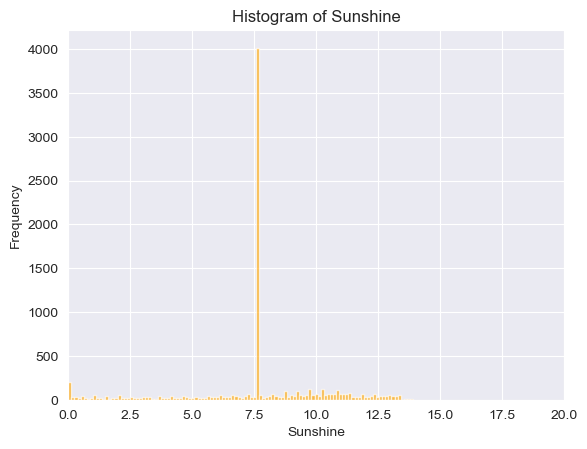

In [31]:
# Let's analyze the 'Sunshine' column by using histogram plot

plt.hist(df['Sunshine'], bins= 'auto', color= 'orange', alpha=0.7)
plt.xlabel('Sunshine')
plt.ylabel('Frequency')
plt.title('Histogram of Sunshine')
plt.xlim(0,20)
plt.show()

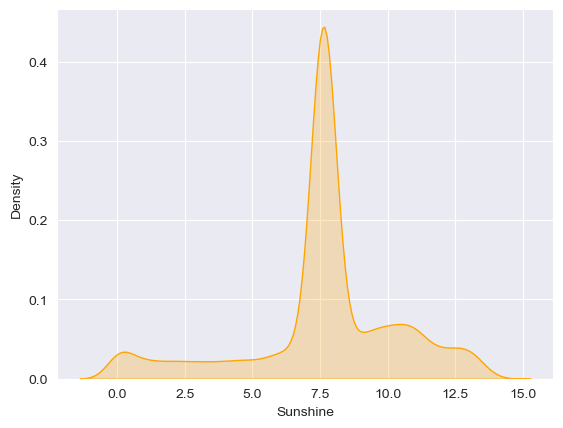

In [32]:
# Now let's analyze the 'Sunshine' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["Sunshine"], shade=True, color='orange')
plt.show()

As we can see here in the analysis plot that distribution is normal with peak is at 7.5, as max vales are fromthat peak.

6. 'WindGustSpeed'

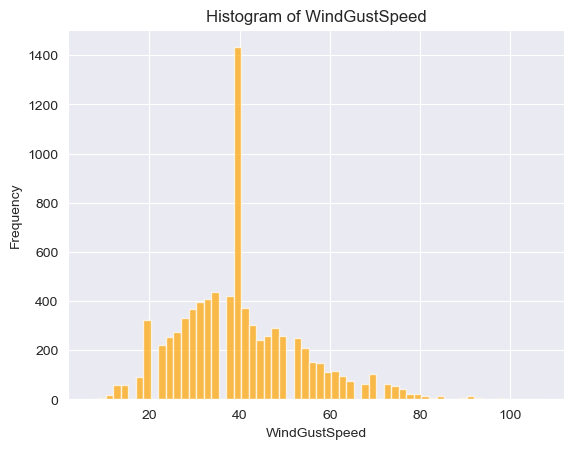

In [33]:
# Let's analyze the 'WindGustSpeed' column by using histogram plot

plt.hist(df['WindGustSpeed'], bins= 'auto', color= 'orange', alpha=0.7)
plt.xlabel('WindGustSpeed')
plt.ylabel('Frequency')
plt.title('Histogram of WindGustSpeed')
plt.show()

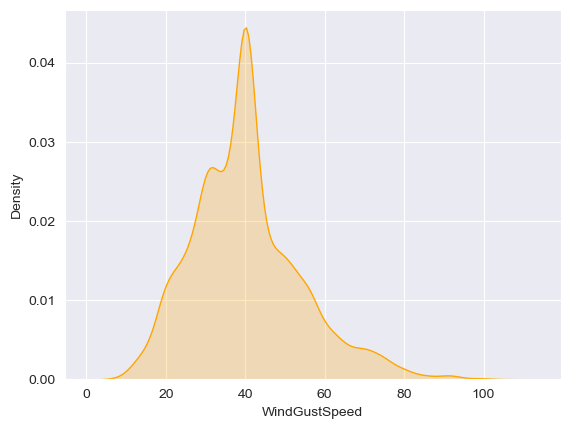

In [34]:
# Now let's analyze the 'WindGustSpeed' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["WindGustSpeed"], shade=True, color='orange')
plt.show()

Here we can see slightly right skewed distribution in the data with peak is at 40, as max values lies there.

7. 'WindSpeed9am'

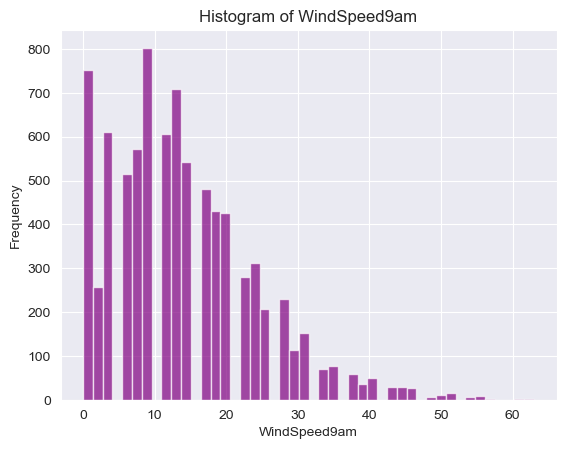

In [35]:
# Let's analyze the 'WindSpeed9am' column by using histogram plot

plt.hist(df['WindSpeed9am'], bins= 'auto', color= 'purple', alpha=0.7)
plt.xlabel('WindSpeed9am')
plt.ylabel('Frequency')
plt.title('Histogram of WindSpeed9am')
plt.show()

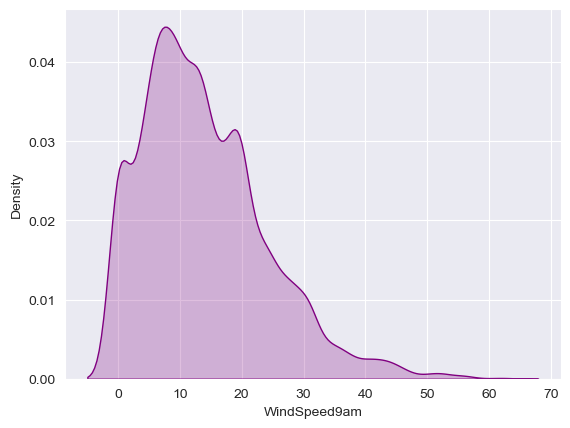

In [36]:
# Now let's analyze the 'WindSpeed9am' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["WindSpeed9am"], shade=True, color='purple')
plt.show()

Here in the analysis we can see right skewed distribution with the peak is around 10, as most of the values lies there.

8. 'WindSpeed3pm'

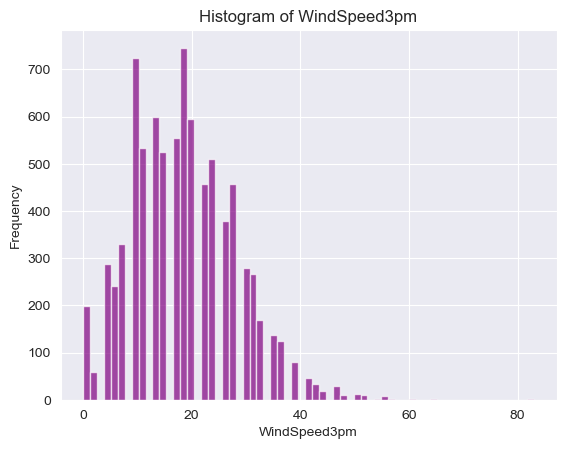

In [37]:
# Let's analyze the 'WindSpeed3pm' column by using histogram plot

plt.hist(df['WindSpeed3pm'], bins= 'auto', color= 'purple', alpha=0.7)
plt.xlabel('WindSpeed3pm')
plt.ylabel('Frequency')
plt.title('Histogram of WindSpeed3pm')
plt.show()

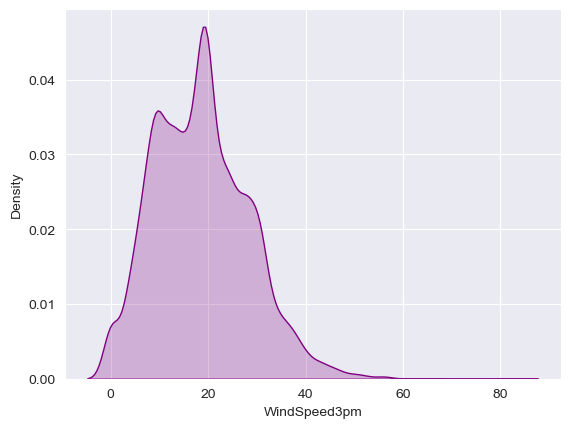

In [38]:
# Now let's analyze the 'WindSpeed3pm' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["WindSpeed3pm"], shade=True, color='purple')
plt.show()

As we can see this analysis plot, distribution is right skewed with peak ia at 20.

9. 'Humidity9am'

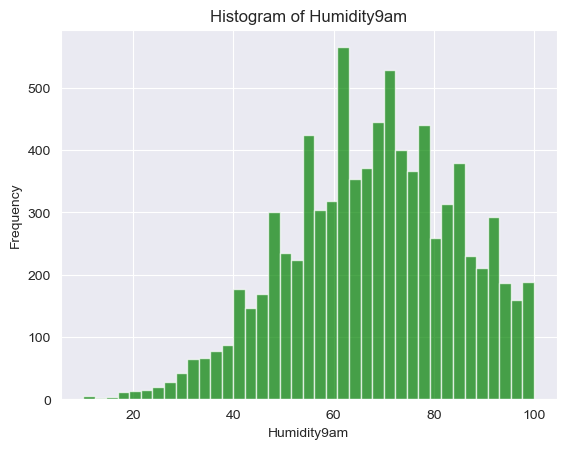

In [39]:
# Let's analyze the 'Humidity9am' column by using histogram plot

plt.hist(df['Humidity9am'], bins= 'auto', color= 'green', alpha=0.7)
plt.xlabel('Humidity9am')
plt.ylabel('Frequency')
plt.title('Histogram of Humidity9am')
plt.show()

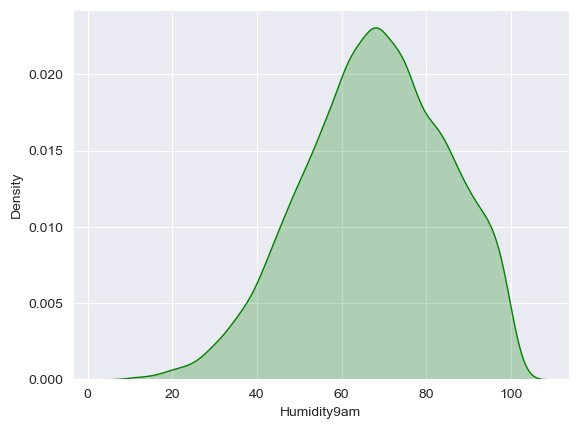

In [40]:
# Now let's analyze the 'Humidity9am' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["Humidity9am"], shade=True, color='green')
plt.show()

As we can see analysis plot, distribution is slightly left skewed, and peak is nearby 60, as max values lies here.

10. 'Humidity3pm'

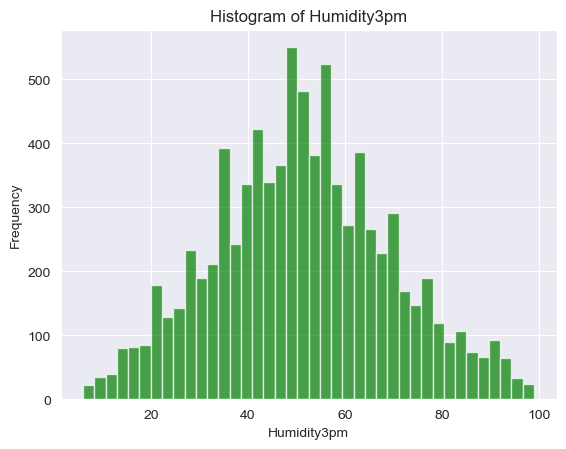

In [41]:
# Let's analyze the 'Humidity3pm' column by using histogram plot

plt.hist(df['Humidity3pm'], bins= 'auto', color= 'green', alpha=0.7)
plt.xlabel('Humidity3pm')
plt.ylabel('Frequency')
plt.title('Histogram of Humidity3pm')
plt.show()

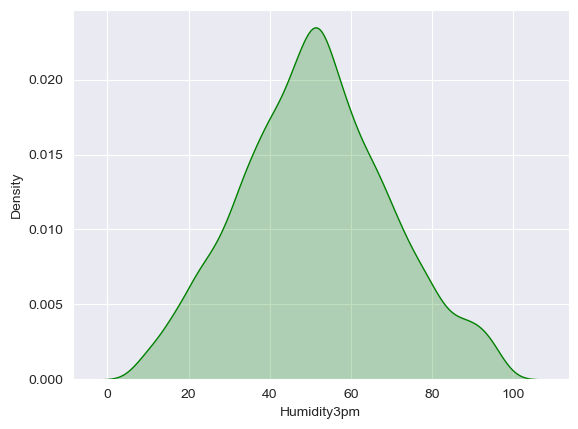

In [42]:
# Now let's analyze the 'Humidity3pm' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["Humidity3pm"], shade=True, color='green')
plt.show()

As we can see in the analysis plot, distribution is symmetrical with the peak is in between 40-60, as maximum values lies here.

11. 'Pressure9am'

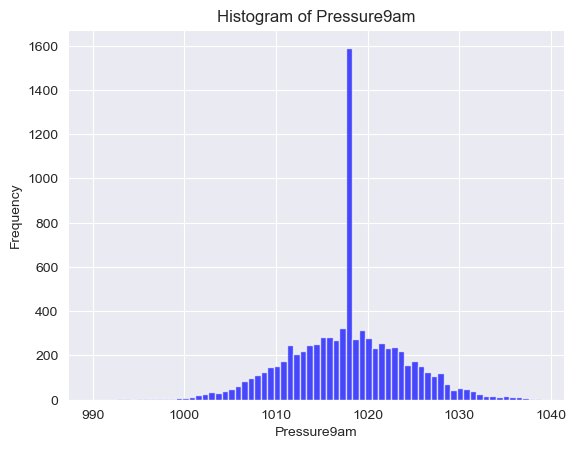

In [43]:
# Let's analyze the 'Pressure9am' column by using histogram plot

plt.hist(df['Pressure9am'], bins= 'auto', color= 'blue', alpha=0.7)
plt.xlabel('Pressure9am')
plt.ylabel('Frequency')
plt.title('Histogram of Pressure9am')
plt.show()

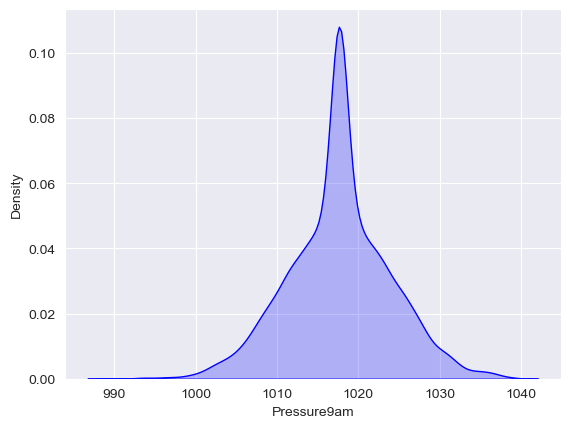

In [44]:
# Now let's analyze the 'Pressure9am' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["Pressure9am"], shade=True, color='blue')
plt.show()

Here we can see the distribution is slightly left skewed with the peak is around value 1020.

12. 'Pressure3pm'

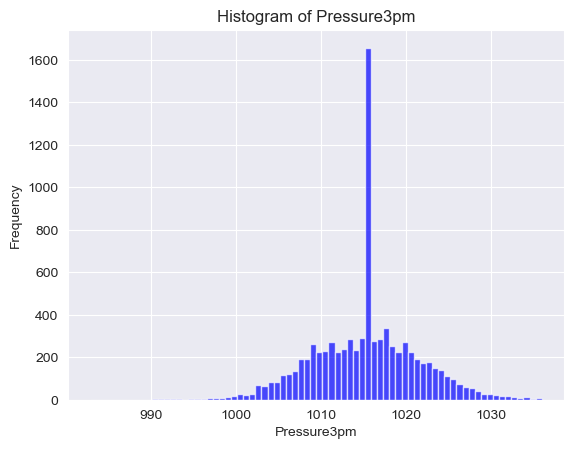

In [45]:
# Let's analyze the 'Pressure3pm' column by using histogram plot

plt.hist(df['Pressure3pm'], bins= 'auto', color= 'blue', alpha=0.7)
plt.xlabel('Pressure3pm')
plt.ylabel('Frequency')
plt.title('Histogram of Pressure3pm')
plt.show()

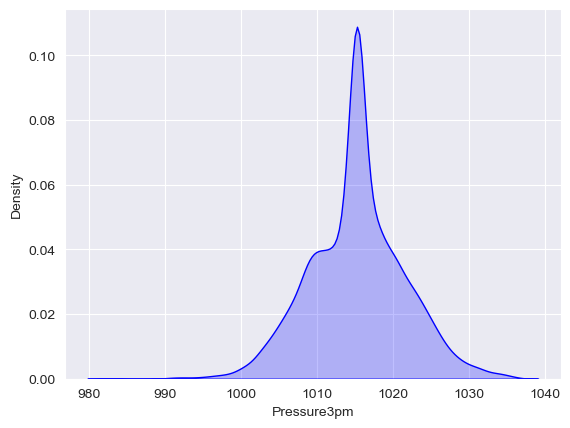

In [46]:
# Now let's analyze the 'Pressure3pm' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["Pressure3pm"], shade=True, color='blue')
plt.show()

As we can analyze in the plot that distribution is slightly left skewed.

13. 'Cloud9am'

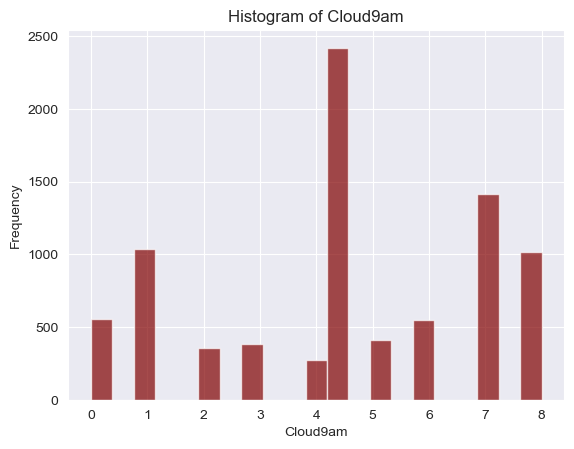

In [47]:
# Let's analyze the 'Cloud9am' column by using histogram plot

plt.hist(df['Cloud9am'], bins= 'auto', color= 'maroon', alpha=0.7)
plt.xlabel('Cloud9am')
plt.ylabel('Frequency')
plt.title('Histogram of Cloud9am')
plt.show()

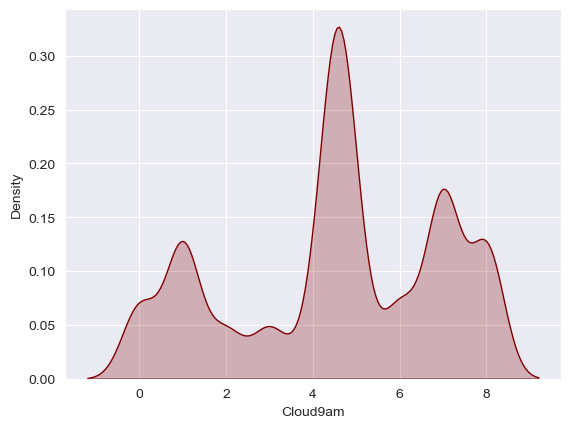

In [48]:
# Now let's analyze the 'Cloud9am' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["Cloud9am"], shade=True, color='maroon')
plt.show()

Here we can see the distribution is bimodal with the peak is near value 4.

14. 'Cloud3pm'

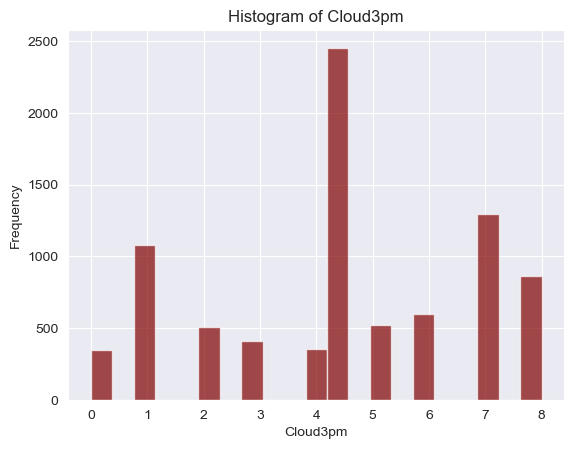

In [49]:
# Let's analyze the 'Cloud3pm' column by using histogram plot

plt.hist(df['Cloud3pm'], bins= 'auto', color= 'maroon', alpha=0.7)
plt.xlabel('Cloud3pm')
plt.ylabel('Frequency')
plt.title('Histogram of Cloud3pm')
plt.show()

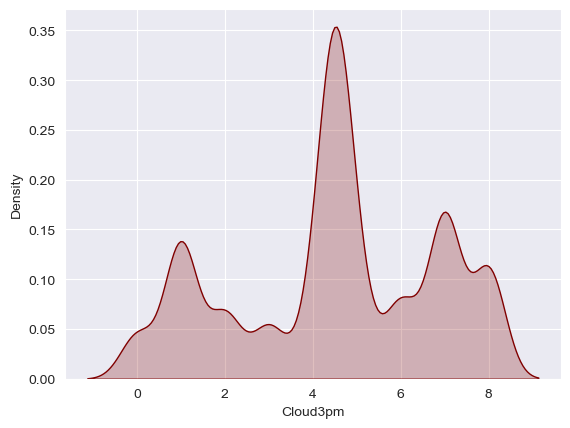

In [50]:
# Now let's analyze the 'Cloud3pm' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["Cloud3pm"], shade=True, color='maroon')
plt.show()

Here we can analyze the plot similar to 'Cloud9am' plot.

15. 'Temp9am'

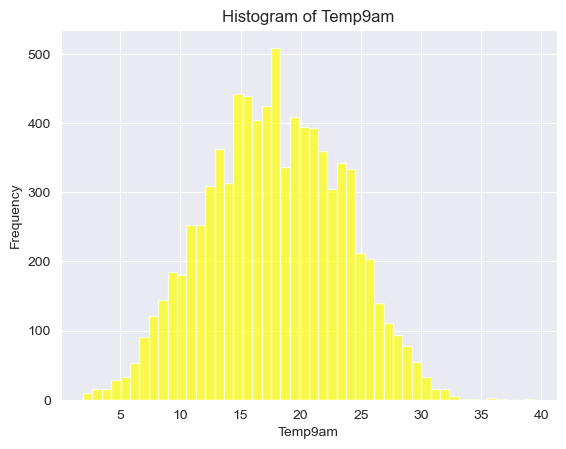

In [51]:
# Let's analyze the 'Temp9am' column by using histogram plot

plt.hist(df['Temp9am'], bins= 'auto', color= 'yellow', alpha=0.7)
plt.xlabel('Temp9am')
plt.ylabel('Frequency')
plt.title('Histogram of Temp9am')
plt.show()

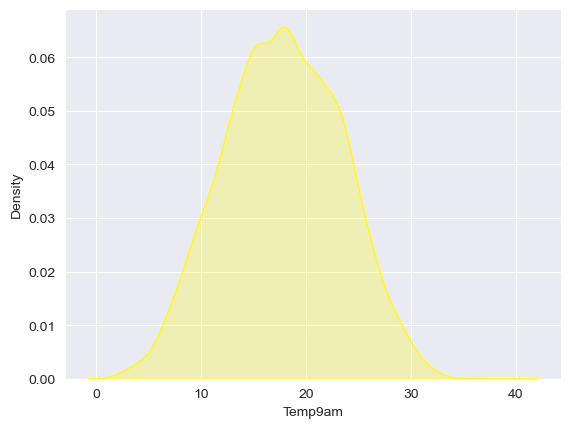

In [52]:
# Now let's analyze the 'Temp9am' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["Temp9am"], shade=True, color='yellow')
plt.show()

Here we can analyze the distribution is symmetrical with the peak is in between 15-20.

16. 'Temp3pm'

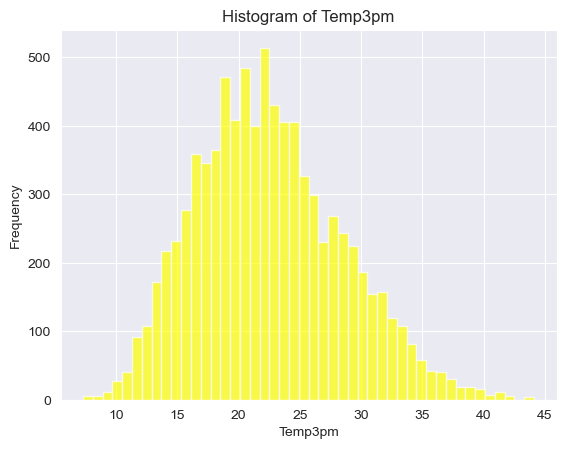

In [53]:
# Let's analyze the 'Temp3pm' column by using histogram plot

plt.hist(df['Temp3pm'], bins= 'auto', color= 'yellow', alpha=0.7)
plt.xlabel('Temp3pm')
plt.ylabel('Frequency')
plt.title('Histogram of Temp3pm')
plt.show()

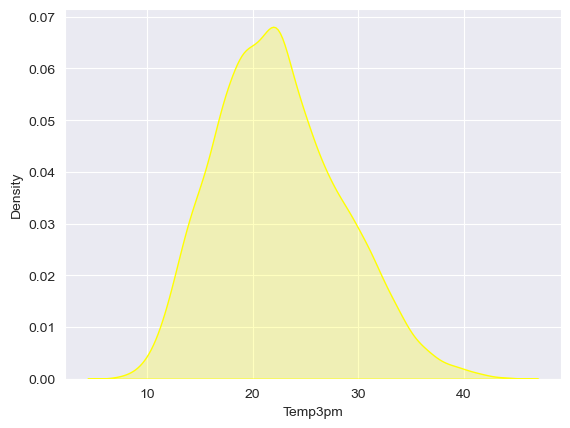

In [54]:
# Now let's analyze the 'Temp3pm' column by using density plot

sns.set_style("darkgrid")
sns.kdeplot(df["Temp3pm"], shade=True, color='yellow')
plt.show()

Here we can see distribution is slightly right skewed, with the peak in between 20-25 values.

Bivariate Analysis

Here we will be using barplot and scatterplot to visualize relation between two variables.

1. 'RainTomorrow' vs 'MinTemp'

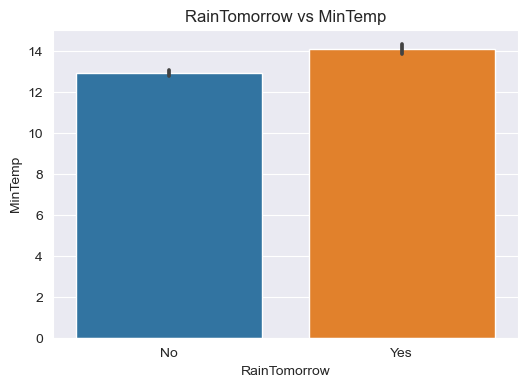

In [55]:
plt.figure(figsize= (6,4))
sns.barplot(data=df, x= 'RainTomorrow', y= 'MinTemp')
plt.xlabel('RainTomorrow')
plt.ylabel('MinTemp')
plt.title('RainTomorrow vs MinTemp')
plt.show()

Here analysis of plots suggests that on average minimum temperature tends to be higher on days when rain is predicted for tomorrow.

2. 'RainTomorrow' vs 'MaxTemp'

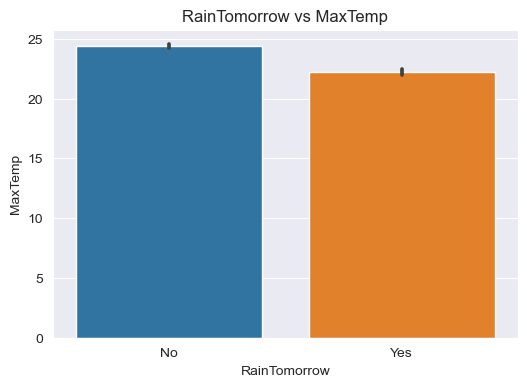

In [56]:
plt.figure(figsize= (6,4))
sns.barplot(data=df, x= 'RainTomorrow', y= 'MaxTemp')
plt.xlabel('RainTomorrow')
plt.ylabel('MaxTemp')
plt.title('RainTomorrow vs MaxTemp')
plt.show()

Here analysis of plots suggests that on average maximum temperature tends to be higher on days when rain is not predicted for tomorrow.

3. 'RainTomorrow' vs 'Rainfall'

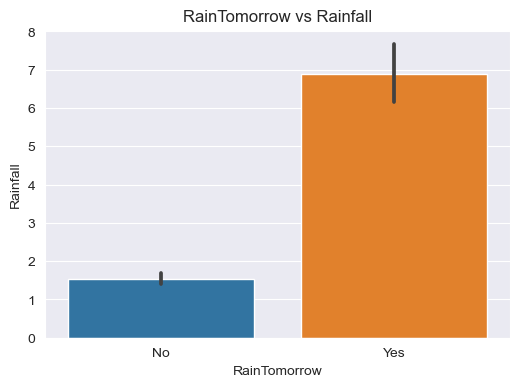

In [57]:
plt.figure(figsize= (6,4))
sns.barplot(data=df, x= 'RainTomorrow', y= 'Rainfall')
plt.xlabel('RainTomorrow')
plt.ylabel('Rainfall')
plt.title('RainTomorrow vs Rainfall')
plt.show()

Here analysis suggests that rainfall tends to be higher on days when the rain is predicted for next days compared to days when rain is not predicted.

4. 'RainTomorrow' vs 'WindSpeed9am'

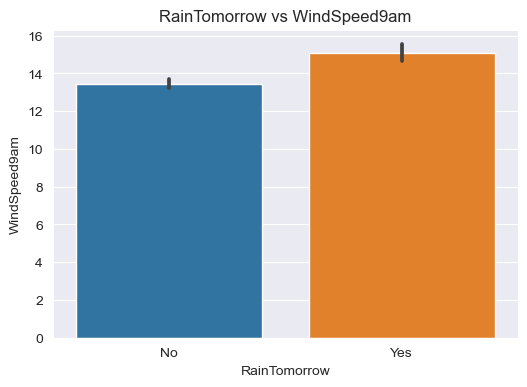

In [58]:
plt.figure(figsize= (6,4))
sns.barplot(data=df, x= 'RainTomorrow', y= 'WindSpeed9am')
plt.xlabel('RainTomorrow')
plt.ylabel('WindSpeed9am')
plt.title('RainTomorrow vs WindSpeed9am')
plt.show()

Here analysis plot suggests that wind speed at 9am tends to be higher on days when the rain is predicted for tomorrow.

5. 'RainTomorrow' vs 'WindSpeed3pm'

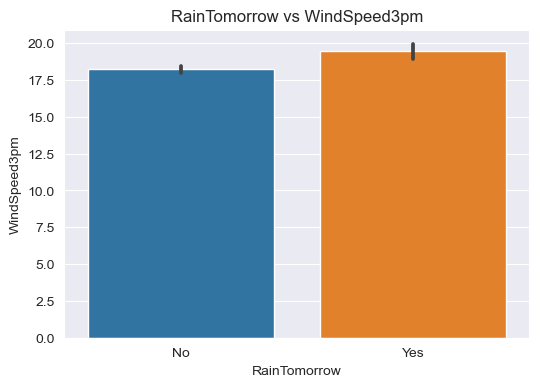

In [59]:
plt.figure(figsize= (6,4))
sns.barplot(data=df, x= 'RainTomorrow', y= 'WindSpeed3pm')
plt.xlabel('RainTomorrow')
plt.ylabel('WindSpeed3pm')
plt.title('RainTomorrow vs WindSpeed3pm')
plt.show()

Here analysis plot suggests that wind speed at 3pm tends to be higher on days when the rain is predicted for tomorrow.

6. 'RainTomorrow' vs 'Humidity9am'

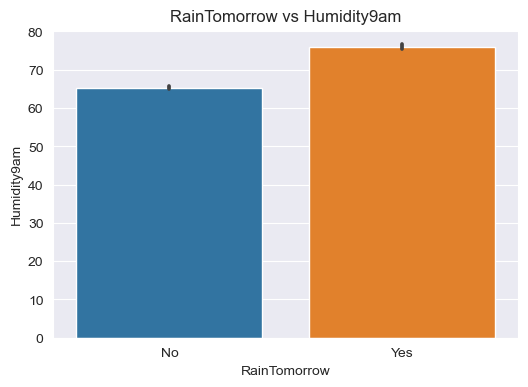

In [60]:
plt.figure(figsize= (6,4))
sns.barplot(data=df, x= 'RainTomorrow', y= 'Humidity9am')
plt.xlabel('RainTomorrow')
plt.ylabel('Humidity9am')
plt.title('RainTomorrow vs Humidity9am')
plt.show()

Here analysis plot suggests that Humidity at 9am tends to be higher for the days when rain is predicted for tomorrow.

7. 'RainTomorrow' vs 'Humidity3pm'

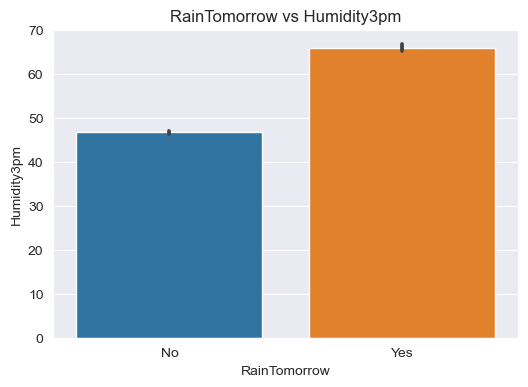

In [61]:
plt.figure(figsize= (6,4))
sns.barplot(data=df, x= 'RainTomorrow', y= 'Humidity3pm')
plt.xlabel('RainTomorrow')
plt.ylabel('Humidity3pm')
plt.title('RainTomorrow vs Humidity3pm')
plt.show()

Here analysis plot suggests that humidity at 3pm is tends to be higher for the days when rain is predicted for tomorrow.

8. 'RainTomorrow' vs 'Pressure9am'

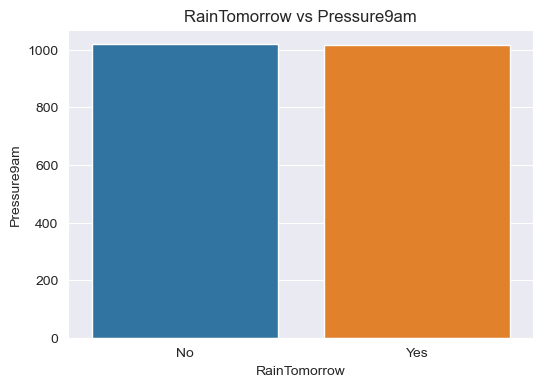

In [62]:
plt.figure(figsize= (6,4))
sns.barplot(data=df, x= 'RainTomorrow', y= 'Pressure9am')
plt.xlabel('RainTomorrow')
plt.ylabel('Pressure9am')
plt.title('RainTomorrow vs Pressure9am')
plt.show()

Here analysis plots suggests that there is no significant difference.

9. 'RainTomorrow' vs 'Pressure3pm'

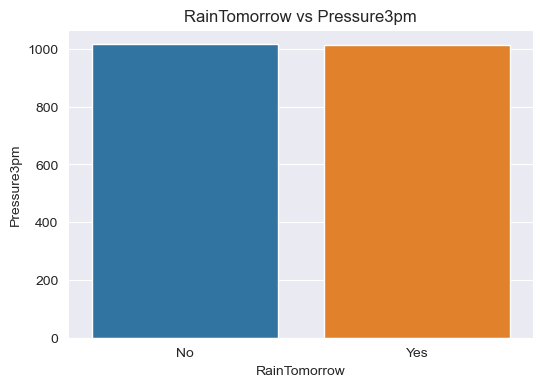

In [63]:
plt.figure(figsize= (6,4))
sns.barplot(data=df, x= 'RainTomorrow', y= 'Pressure3pm')
plt.xlabel('RainTomorrow')
plt.ylabel('Pressure3pm')
plt.title('RainTomorrow vs Pressure3pm')
plt.show()

Here too we can see no significant difference.

10. 'RainTomorrow' vs 'Cloud9am'

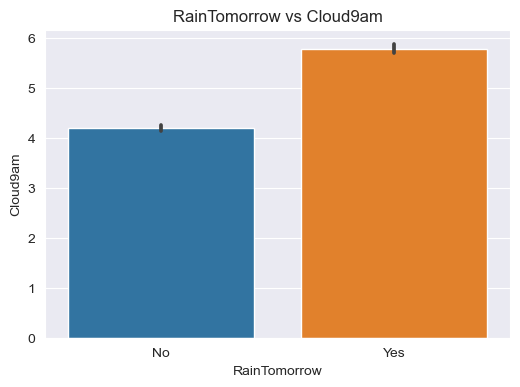

In [64]:
plt.figure(figsize= (6,4))
sns.barplot(data=df, x= 'RainTomorrow', y= 'Cloud9am')
plt.xlabel('RainTomorrow')
plt.ylabel('Cloud9am')
plt.title('RainTomorrow vs Cloud9am')
plt.show()

Here analysis plots suggests that cloud at 9am tends to be higher for the days when the rain is predicted for tomorrow.

11. 'RainTomorrow' vs 'Cloud3pm'

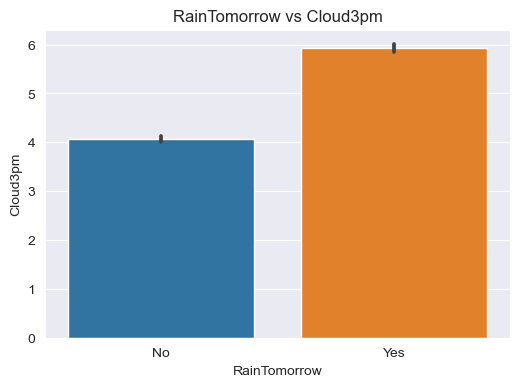

In [65]:
plt.figure(figsize= (6,4))
sns.barplot(data=df, x= 'RainTomorrow', y= 'Cloud3pm')
plt.xlabel('RainTomorrow')
plt.ylabel('Cloud3pm')
plt.title('RainTomorrow vs Cloud3pm')
plt.show()

Here too analysis suggests that cloud at 3pm tends to be higher for the days when the rain is predicted for tomorrow.

12. 'RainTomorrow' vs 'Temp9am'

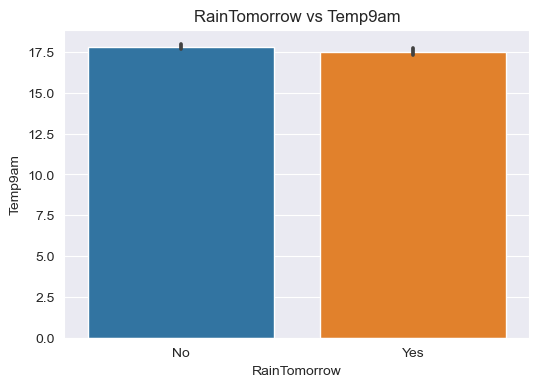

In [66]:
plt.figure(figsize= (6,4))
sns.barplot(data=df, x= 'RainTomorrow', y= 'Temp9am')
plt.xlabel('RainTomorrow')
plt.ylabel('Temp9am')
plt.title('RainTomorrow vs Temp9am')
plt.show()

Here we can see temp at 9am tends to be slightly high for the days when rain is not predicted.

13. 'RainTomorrow' vs 'Temp3pm'

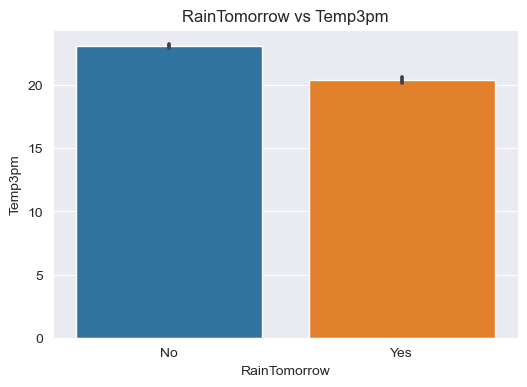

In [67]:
plt.figure(figsize= (6,4))
sns.barplot(data=df, x= 'RainTomorrow', y= 'Temp3pm')
plt.xlabel('RainTomorrow')
plt.ylabel('Temp3pm')
plt.title('RainTomorrow vs Temp3pm')
plt.show()

Here we can see the temp at 3pm tends to be high for the days when rain is not predicted compared to predict.

14. 'Rainfall' vs 'RainToday'

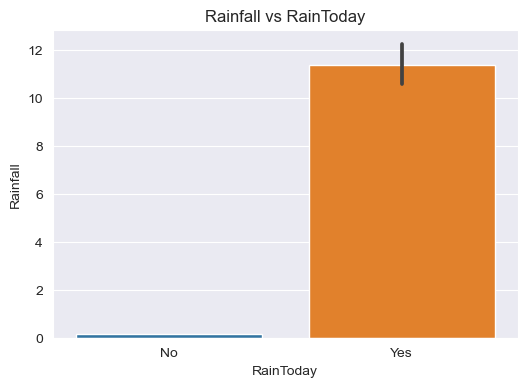

In [68]:
plt.figure(figsize= (6,4))
sns.barplot(data=df, y= 'Rainfall', x= 'RainToday')
plt.ylabel('Rainfall')
plt.xlabel('RainToday')
plt.title('Rainfall vs RainToday')
plt.show()

15. 'Rainfall' vs 'MinTemp'

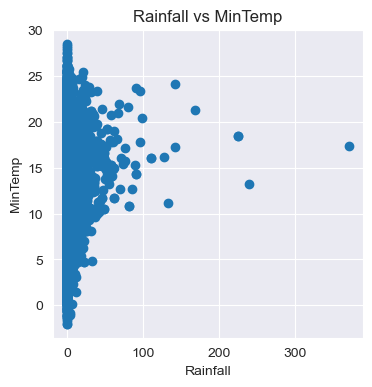

In [69]:
plt.figure(figsize= (4,4))
plt.scatter(df['Rainfall'], df['MinTemp'])
plt.xlabel('Rainfall')
plt.ylabel('MinTemp')
plt.title('Rainfall vs MinTemp')
plt.show()

Here we can see Null correlation.

16. 'Rainfall' vs 'MaxTemp'

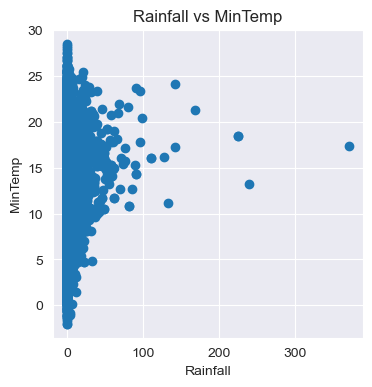

In [70]:
plt.figure(figsize= (4,4))
plt.scatter(df['Rainfall'], df['MinTemp'])
plt.xlabel('Rainfall')
plt.ylabel('MinTemp')
plt.title('Rainfall vs MinTemp')
plt.show()

Here too we can see null correlation.

17. 'Rainfall' vs 'WindSpeed9am'

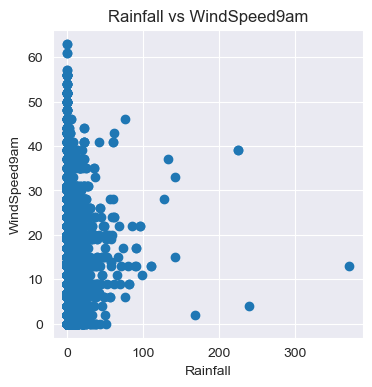

In [71]:
plt.figure(figsize= (4,4))
plt.scatter(df['Rainfall'], df['WindSpeed9am'])
plt.xlabel('Rainfall')
plt.ylabel('WindSpeed9am')
plt.title('Rainfall vs WindSpeed9am')
plt.show()

Here too Null correlation

18. 'Rainfall' vs 'WindSpeed3pm'

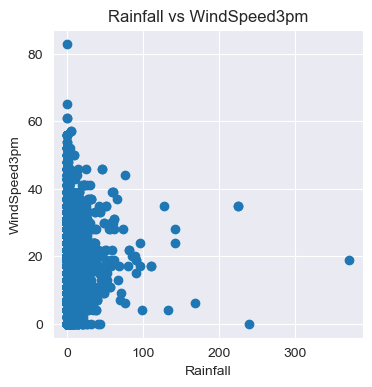

In [72]:
plt.figure(figsize= (4,4))
plt.scatter(df['Rainfall'], df['WindSpeed3pm'])
plt.xlabel('Rainfall')
plt.ylabel('WindSpeed3pm')
plt.title('Rainfall vs WindSpeed3pm')
plt.show()

Null correlation.

19. 'Rainfall' vs 'Humidity9am'

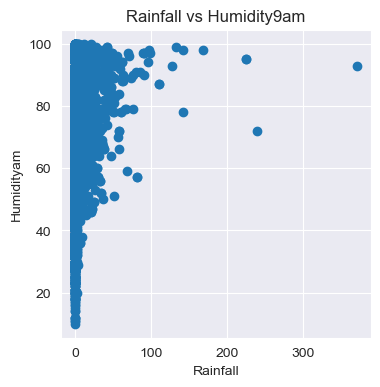

In [73]:
plt.figure(figsize= (4,4))
plt.scatter(df['Rainfall'], df['Humidity9am'])
plt.xlabel('Rainfall')
plt.ylabel('Humidityam')
plt.title('Rainfall vs Humidity9am')
plt.show()

20. 'Rainfall' vs 'Pressure9am'

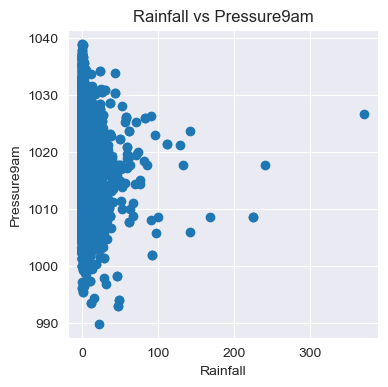

In [74]:
plt.figure(figsize= (4,4))
plt.scatter(df['Rainfall'], df['Pressure9am'])
plt.xlabel('Rainfall')
plt.ylabel('Pressure9am')
plt.title('Rainfall vs Pressure9am')
plt.show()

21. 'Rainfall' vs 'Cloud9am'

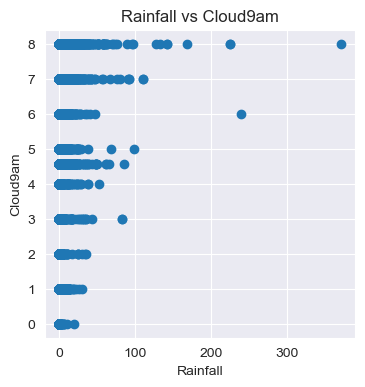

In [75]:
plt.figure(figsize= (4,4))
plt.scatter(df['Rainfall'], df['Cloud9am'])
plt.xlabel('Rainfall')
plt.ylabel('Cloud9am')
plt.title('Rainfall vs Cloud9am')
plt.show()

22. 'Rainfall' vs 'Temp9am'

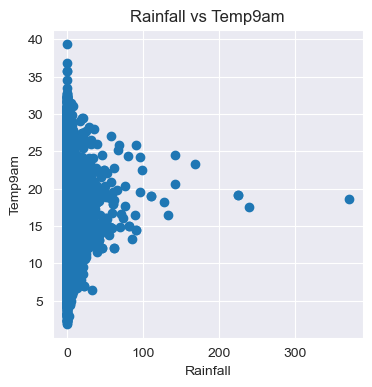

In [76]:
plt.figure(figsize= (4,4))
plt.scatter(df['Rainfall'], df['Temp9am'])
plt.xlabel('Rainfall')
plt.ylabel('Temp9am')
plt.title('Rainfall vs Temp9am')
plt.show()

Null correlation

Multivariate Analysis

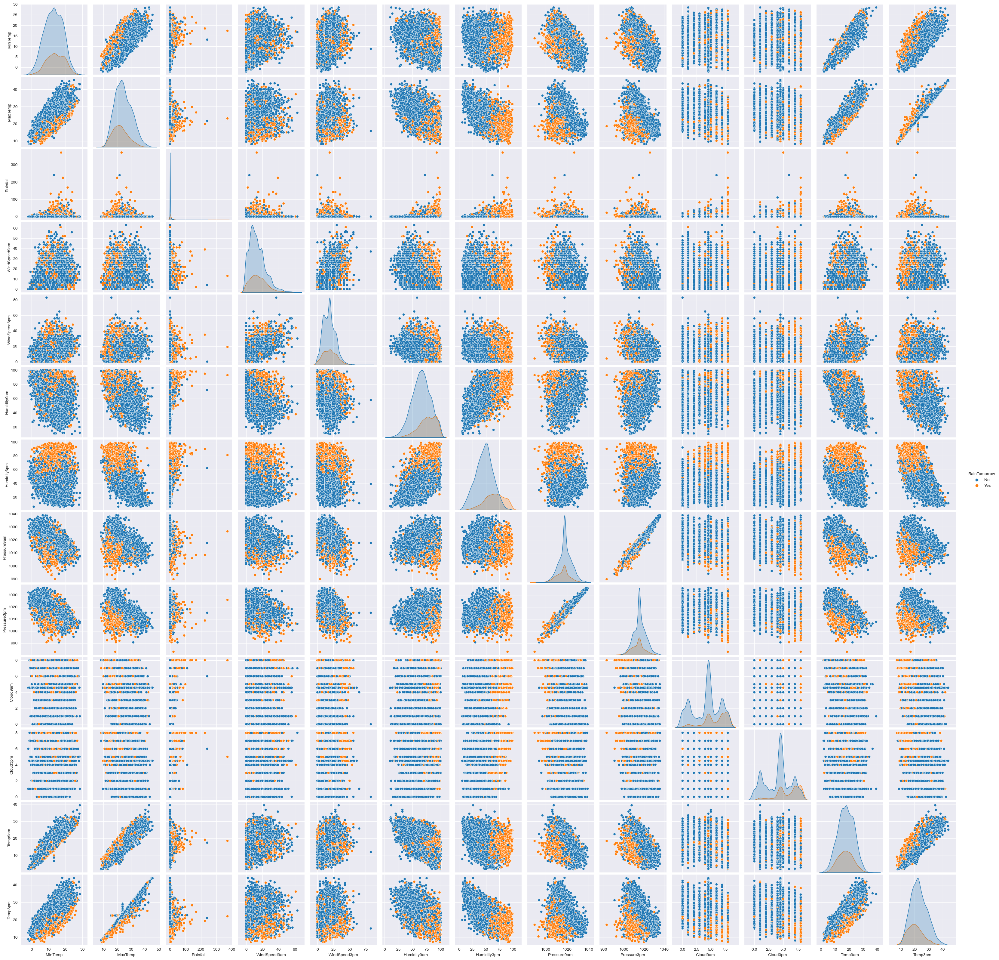

In [77]:
# Using pairplot
subset_vars= ['MinTemp', 'MaxTemp', 'Rainfall', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow']
sns.pairplot(data=df[subset_vars] , hue= 'RainTomorrow')
plt.show()

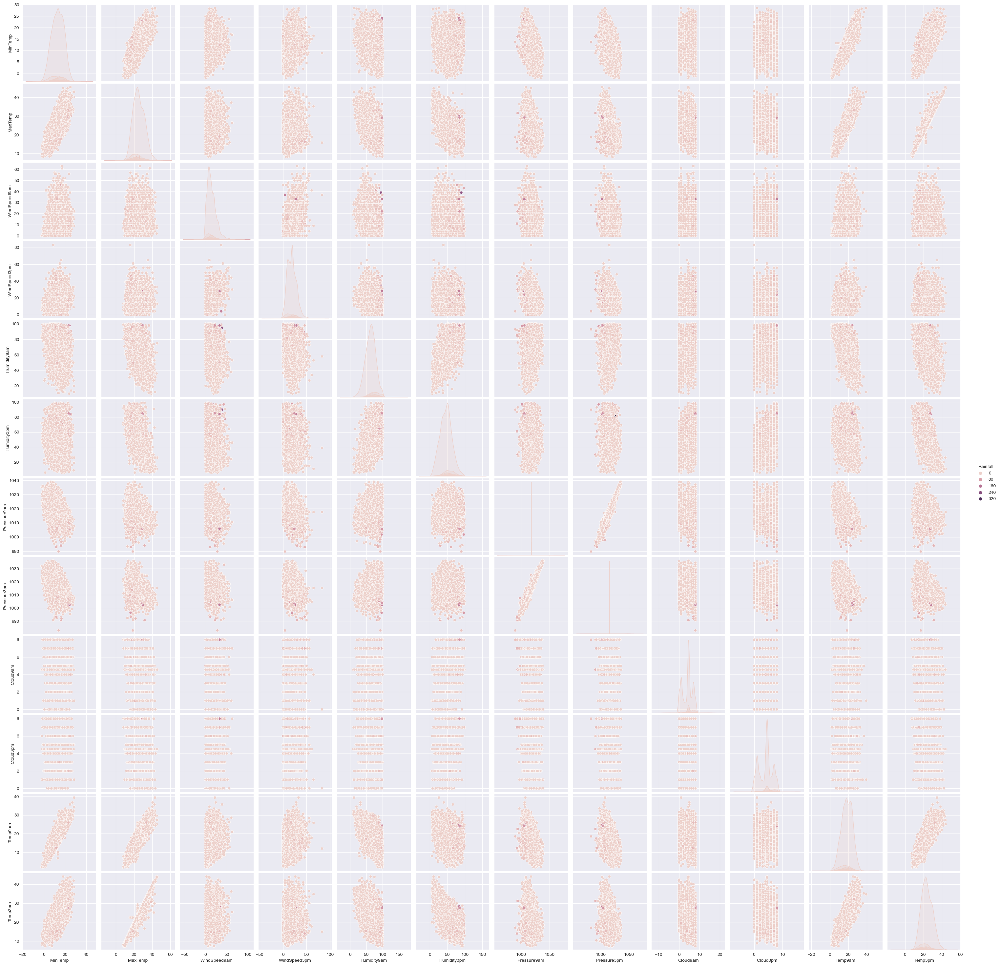

In [78]:
subset_vars= ['MinTemp', 'MaxTemp', 'Rainfall', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow']
sns.pairplot(data=df[subset_vars] , hue= 'Rainfall')
plt.show()

# Data Preprocessing

# Outliers

Here first we will check all the numerical columns to check the presence of outliers there and then will proceed with handling them either by treating them or by removing them.

We will be using winsorizing method first to treat outliers and then will be using clip() function to limit the extreme values. By cliping these extreme values we will be setting boundaries to prevent extremely high or low values from skewing the data for analysisresults. This will help us here to mitigate the impact of outliers and extreme observations on the analysis and avoid causing data loss.

For this we will be importing necessary library first from scipy.stats.mstats

Winsorizing Method: Winsorizing is a data transformation technique used to handle outliers or extreme values in a dataset. It involves replacing extreme values with less extreme values, thereby reducing the impact of outliers on statistical analysis. In winsorizing, we will be trimming or censoring the extreme values by replacing them with the value which is closer to rest of the data. It helps in reducoing the impact of outliers on the statistical measures and provides a more robust analysis.It ensures that extreme values do not unduly influence the results or skew the distribution of the data.

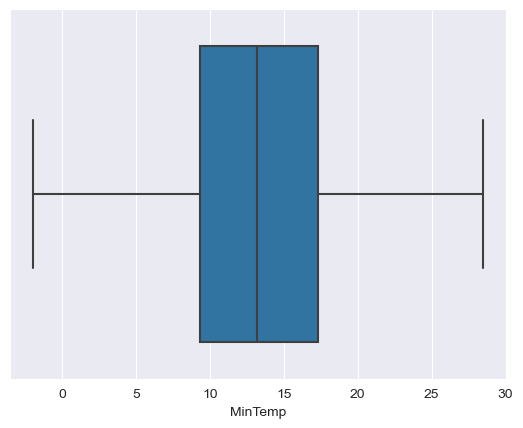

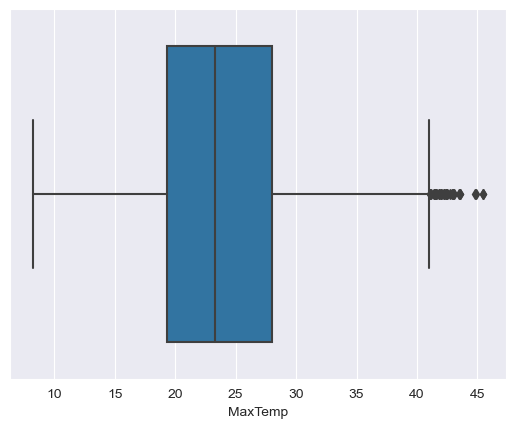

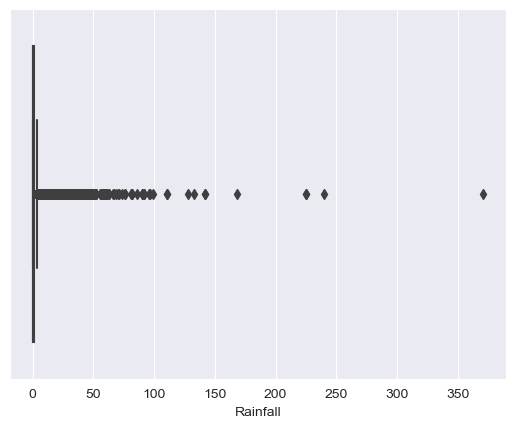

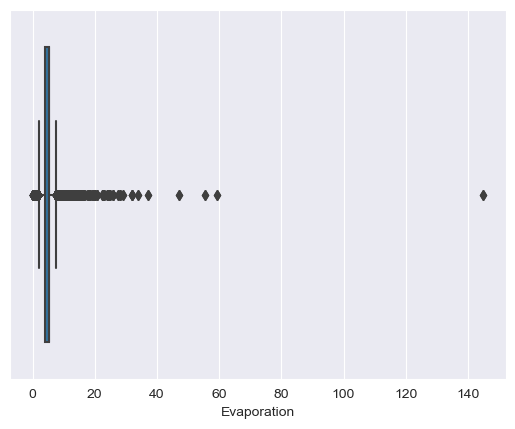

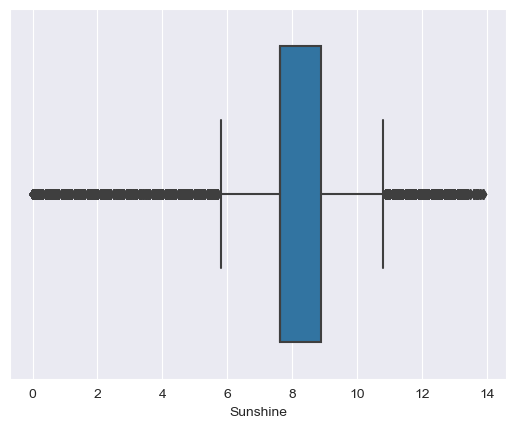

...

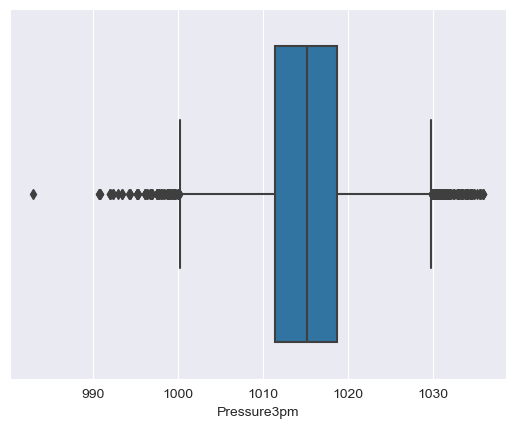

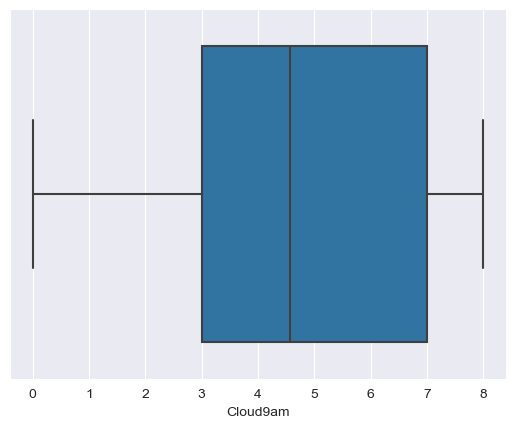

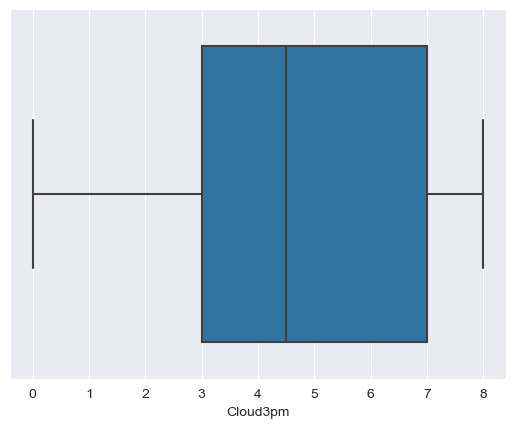

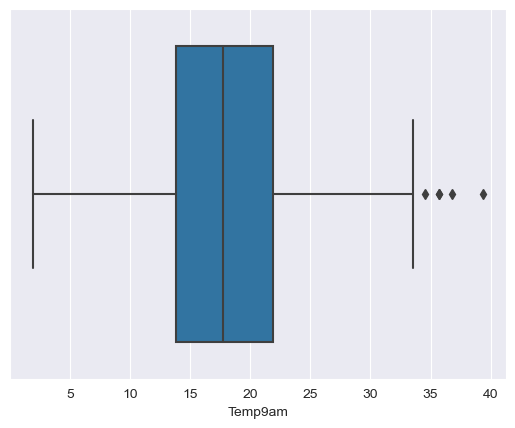

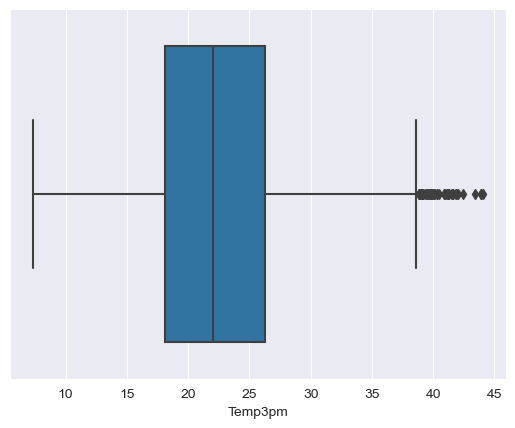

In [79]:
# Lets check the outliers

numerical_columns = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']

for column in numerical_columns:
    sns.boxplot(x=df[column])
    plt.show()

In [80]:
from scipy.stats.mstats import winsorize

# Winsorize all numerical columns
num_cols = df.select_dtypes(include=np.number).columns.tolist()
df[num_cols] = df[num_cols].apply(lambda x: winsorize(x, limits=[0.05, 0.05]), axis=0)

# Clip extreme values
clip_values = df[num_cols].quantile([0.01, 0.99])
df[num_cols] = df[num_cols].clip(lower=clip_values.loc[0.01], upper=clip_values.loc[0.99], axis=1)

In [81]:
from scipy import stats
from scipy.stats import zscore

z_threshold = 3

# Clculate z-score for numerical columns
columns= ['Rainfall', 'Evaporation', 'Sunshine']
z_scores= stats.zscore(df[columns])

# Identify and remove the outliers
outlier_indices= (np.abs(z_scores)> z_threshold).any(axis=1)
df= df[~outlier_indices]

In [82]:
df.shape

(7974, 22)

As we have treated outliers, and clipped the extreme values,and try to remove few with z-score technique by such way we have handled them possibly. But let's drop 'Evaporation' and 'Sunshine' columns, as it shows no relevance and have extreme outliers.

In [83]:
df= df.drop(['Evaporation', 'Sunshine'], axis= 1)

# Skewness

Here we will be checking for skewness and those values which are not in the range of -0.5 to +0.5, will be handling them.

We will be using Yeo-johnson transformation technique to handle the skewness in the column.

Yeo-Johnson transformation: It is a statistical measure and a power transformation technique used to transform a non-normal distribution into a distribution that closely resembles a normal distribution. It is a extension to Boxcox transformation. It involves applying power transformation to the original data. It helps in improving the model's performance. Implementing the Yeo-Johnson transformation in Python can be done using libraries such as SciPy or scikit-learn, using 'from sklearn.preprocessing import PowerTransformer' .

In [84]:
df.skew()

MinTemp         -0.046497
MaxTemp          0.244876
Rainfall         2.822578
WindGustSpeed    0.451586
WindSpeed9am     0.490382
WindSpeed3pm     0.200113
Humidity9am     -0.049959
Humidity3pm      0.098962
Pressure9am     -0.010480
Pressure3pm      0.005363
Cloud9am        -0.337287
Cloud3pm        -0.157924
Temp9am         -0.029444
Temp3pm          0.236959
dtype: float64

In [85]:
from sklearn.preprocessing import PowerTransformer

# Define columns to transform
columns = ['Rainfall']
# Apply Yeo-Johnson transformation to selected columns
pt = PowerTransformer(method='yeo-johnson')
df[columns] = pt.fit_transform(df[columns])

# Round transformed values to 2 decimal places
df[columns] = df[columns].round(2)

df.skew()

MinTemp         -0.046497
MaxTemp          0.244876
Rainfall         1.002917
WindGustSpeed    0.451586
WindSpeed9am     0.490382
WindSpeed3pm     0.200113
Humidity9am     -0.049959
Humidity3pm      0.098962
Pressure9am     -0.010480
Pressure3pm      0.005363
Cloud9am        -0.337287
Cloud3pm        -0.157924
Temp9am         -0.029444
Temp3pm          0.236959
dtype: float64

In [86]:
# Apply log transformation to few columns
df['Rainfall'] = np.log(df['Rainfall'] + 1)

df.skew()

MinTemp         -0.046497
MaxTemp          0.244876
Rainfall         0.822583
WindGustSpeed    0.451586
WindSpeed9am     0.490382
WindSpeed3pm     0.200113
Humidity9am     -0.049959
Humidity3pm      0.098962
Pressure9am     -0.010480
Pressure3pm      0.005363
Cloud9am        -0.337287
Cloud3pm        -0.157924
Temp9am         -0.029444
Temp3pm          0.236959
dtype: float64

Skewness is handled possibly.

# Encoding Categorical Columns

Here we will be using Label encoder method to encode the categorical column into numerical column.

Label Encoder: Label encoding assigns numerical labels to each unique category in a categorical variable using integers starting from 0.The labels are assigned in an ordinal manner, which means that the labels are ordered based on the alphabetical or numerical order of the categories.

For this we will be importing library from 'sklearn.preprocessing import LabelEncoder'

Lets encode categorical columns.

In [87]:
from sklearn.preprocessing import LabelEncoder

# Get all categorical columns
cat_columns = df.select_dtypes(include=['object']).columns.tolist()

# Initialize LabelEncoder
le = LabelEncoder()

# Apply LabelEncoder to each categorical column
for col in cat_columns:
    df[col] = le.fit_transform(df[col])
    
df.dtypes    

Location           int64
MinTemp          float64
MaxTemp          float64
Rainfall         float64
WindGustDir        int64
WindGustSpeed    float64
WindDir9am         int64
WindDir3pm         int64
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday          int64
RainTomorrow       int64
dtype: object

In [88]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7974 entries, 0 to 8424
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       7974 non-null   int64  
 1   MinTemp        7974 non-null   float64
 2   MaxTemp        7974 non-null   float64
 3   Rainfall       7974 non-null   float64
 4   WindGustDir    7974 non-null   int64  
 5   WindGustSpeed  7974 non-null   float64
 6   WindDir9am     7974 non-null   int64  
 7   WindDir3pm     7974 non-null   int64  
 8   WindSpeed9am   7974 non-null   float64
 9   WindSpeed3pm   7974 non-null   float64
 10  Humidity9am    7974 non-null   float64
 11  Humidity3pm    7974 non-null   float64
 12  Pressure9am    7974 non-null   float64
 13  Pressure3pm    7974 non-null   float64
 14  Cloud9am       7974 non-null   float64
 15  Cloud3pm       7974 non-null   float64
 16  Temp9am        7974 non-null   float64
 17  Temp3pm        7974 non-null   float64
 18  RainToda

In [89]:
df.describe()

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
count,7974.000000,7974.000000,7974.000000,7974.000000,7974.000000,7974.000000,7974.000000,7974.000000,7974.000000,7974.000000,7974.000000,7974.000000,7974.000000,7974.000000,7974.000000,7974.000000,7974.000000,7974.000000,7974.000000,7974.000000
mean,5.780035,13.083501,23.902255,-0.452988,7.178455,39.665570,7.175821,7.773138,13.388680,18.283986,67.286438,50.311980,1017.745765,1015.288805,4.469973,4.474677,17.742963,22.480034,0.193002,0.215199
std,3.156843,5.054802,5.725025,0.902876,4.704208,12.328439,4.570908,4.437684,9.159892,8.787637,15.593866,16.806841,5.543983,5.529759,2.422698,2.213990,5.279571,5.550638,0.394680,0.410986
min,0.000000,4.300000,14.800000,-1.078810,0.000000,20.000000,0.000000,0.000000,0.000000,4.000000,39.000000,21.000000,1007.100000,1004.900000,0.000000,1.000000,8.500000,13.500000,0.000000,0.000000
25%,3.000000,9.100000,19.400000,-1.078810,3.000000,31.000000,3.000000,4.000000,6.000000,11.000000,56.000000,38.000000,1014.100000,1011.400000,3.000000,3.000000,13.700000,18.200000,0.000000,0.000000
50%,6.000000,13.193305,23.400000,-1.078810,7.000000,40.174469,7.000000,8.000000,13.000000,19.000000,67.822496,50.000000,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.100000,0.000000,0.000000
75%,8.000000,17.200000,28.200000,0.641854,11.000000,46.000000,11.000000,11.000000,19.000000,24.000000,79.000000,62.000000,1021.400000,1018.900000,7.000000,6.000000,22.000000,26.500000,0.000000,0.000000
max,11.000000,21.500000,34.700000,1.050822,15.000000,67.000000,15.000000,15.000000,33.000000,35.000000,95.000000,83.000000,1028.100000,1025.700000,8.000000,8.000000,26.800000,33.000000,1.000000,1.000000


# Correlation Between Target and Independent Variable

Now here, we will be checking the correlation matrix which shows the relation between target and independent variable. We will get it by using df.corr() function. We will be finding the correlation to know which feature is more positive or negatively correlated to the target vaiable, which will be helping us for the feature selction to avoid overfitting. We will also be visualizing this correlation with using heatmap. And will be using seaborn library for heatmap.

In [90]:
# Let's check correlation

pd.set_option('display.max_columns', None)
df.corr()

,Location,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
Location,1.000000,0.121967,0.060231,0.019269,-0.035624,0.240005,-0.033166,-0.033868,0.236832,0.242416,0.003267,0.057780,-0.046294,-0.034465,0.038292,0.022158,0.117547,0.058895,-0.005282,0.006231
MinTemp,0.121967,1.000000,0.730180,0.036048,-0.153526,0.233961,-0.051223,-0.153387,0.136798,0.194781,-0.141935,0.068847,-0.441321,-0.432407,0.078304,0.020568,0.886790,0.699450,0.025830,0.075496
MaxTemp,0.060231,0.730180,1.000000,-0.248637,-0.231806,0.151670,-0.213302,-0.186671,0.014612,0.102921,-0.370033,-0.400884,-0.357219,-0.431406,-0.251498,-0.249015,0.870658,0.974706,-0.221365,-0.139843
Rainfall,0.019269,0.036048,-0.248637,1.000000,0.146891,0.055507,0.147677,0.118527,0.015983,0.025355,0.394744,0.352398,-0.095394,-0.021093,0.284623,0.248080,-0.137927,-0.259263,0.785903,0.277992
WindGustDir,-0.035624,-0.153526,-0.231806,0.146891,1.000000,-0.003458,0.397684,0.504191,0.036121,0.094014,0.033450,0.057048,-0.094443,-0.008034,0.129974,0.090217,-0.184802,-0.246342,0.125201,0.050521
WindGustSpeed,0.240005,0.233961,0.151670,0.055507,-0.003458,1.000000,-0.094947,0.059868,0.593923,0.647595,-0.300955,-0.117024,-0.390594,-0.356822,0.001056,0.067814,0.206492,0.117207,0.045113,0.173911
WindDir9am,-0.033166,-0.051223,-0.213302,0.147677,0.397684,-0.094947,1.000000,0.243269,0.065196,0.038996,0.009970,0.122384,0.003430,0.084826,0.093421,0.057961,-0.105505,-0.219734,0.138589,0.020583
WindDir3pm,-0.033868,-0.153387,-0.186671,0.118527,0.504191,0.059868,0.243269,1.000000,0.033908,0.071173,-0.014458,-0.020222,-0.125697,-0.036689,0.075701,0.053904,-0.172664,-0.199174,0.096470,0.001464
WindSpeed9am,0.236832,0.136798,0.014612,0.015983,0.036121,0.593923,0.065196,0.033908,1.000000,0.561146,-0.385072,-0.125781,-0.166172,-0.129540,-0.011227,0.050577,0.108227,0.000656,0.029465,0.060441
WindSpeed3pm,0.242416,0.194781,0.102921,0.025355,0.094014,0.647595,0.038996,0.071173,0.561146,1.000000,-0.265305,-0.082043,-0.243982,-0.197999,0.003653,0.006142,0.200042,0.081647,0.005336,0.046335


In [91]:
correlation_matrix= df.corr()
RainTomorrow_correlation= correlation_matrix['RainTomorrow']
print(RainTomorrow_correlation)

correlation_matrix= df.corr()
Rainfall_correlation= correlation_matrix['Rainfall']
print(Rainfall_correlation)

Location         0.006231
MinTemp          0.075496
MaxTemp         -0.139843
Rainfall         0.277992
WindGustDir      0.050521
WindGustSpeed    0.173911
WindDir9am       0.020583
WindDir3pm       0.001464
WindSpeed9am     0.060441
WindSpeed3pm     0.046335
Humidity9am      0.240551
Humidity3pm      0.409004
Pressure9am     -0.150377
Pressure3pm     -0.126417
Cloud9am         0.254410
Cloud3pm         0.330073
Temp9am         -0.028936
Temp3pm         -0.181039
RainToday        0.262748
RainTomorrow     1.000000
Name: RainTomorrow, dtype: float64
Location         0.019269
MinTemp          0.036048
MaxTemp         -0.248637
Rainfall         1.000000
WindGustDir      0.146891
WindGustSpeed    0.055507
WindDir9am       0.147677
WindDir3pm       0.118527
WindSpeed9am     0.015983
WindSpeed3pm     0.025355
Humidity9am      0.394744
Humidity3pm      0.352398
Pressure9am     -0.095394
Pressure3pm     -0.021093
Cloud9am         0.284623
Cloud3pm         0.248080
Temp9am         -0.137927
Tem

In [92]:
df= df.drop(['Location', 'WindDir9am', 'WindDir3pm'], axis=1)

# Visualization of Correlation matrix

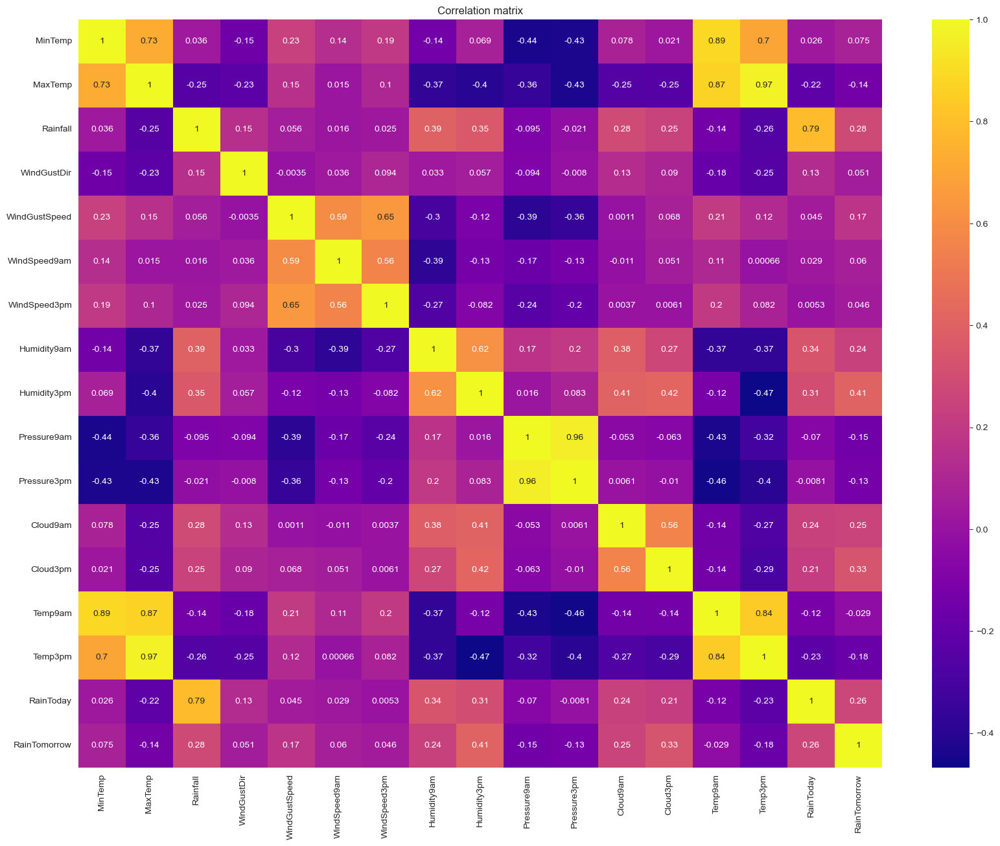

In [93]:
# Let's visualize the relation by using heatmap

correlation_matrix = df.corr()

plt.figure(figsize=(20,15))
sns.heatmap(correlation_matrix, annot=True, cmap='plasma')
plt.title('Correlation matrix')
plt.show()

# Feature Engineering

Now we will be defining the target and independent variable, so that it will be clear what to predict on what basis. Then we will proceed with the feature scaling process using MinMaxScaler from sklearn.preprocessing.

Feature Scaling: It is performed to bring all the features to a similar scale or value range. It basically helps in improving the performance, convergence, and interpretability of ML algorithm. It ensures that all features should be treated equally during the modeling.

MinMaxScaler: This technique used to transform features by scaling them to a specified range which should be between 0-1. It ensures that all features are scaled proportionally. This technique is useful to preserve the shape of the original distribution while bringing all features to a common scale.

After this we will proceed with checking out for multicollinearity by finding the vif(variation inflation factor) values. For this we will be importing statsmodels.api and then from statsmodels.stats.outliers_inflation importing variance_inflation_factor to find out the vif values for the features.

A vif value 1 indicates no multicollinearity, while values greater than 1 suggest increasing multicollinearity. Generally , vif value above 5 or 10 is considered very high, so in that case we need to handle the multicollinearity.

If we will find any value above range we will be handling that by dropping one or two column with high multicollinearity, an will also be adding constant term for calculating vif. A constant term will allow and help us for a more accurate assessment of multicollinearity and its impact on predictor variable.

After handling multicollinearity issue, we will proceed with finding the Best Random State, which will ensure that further operations should be reproducible. Here we will be using logistic regression algorithm for classification tasks to generate the best random state. The genrated best random score by this alogorithm should be used in all further runs for results reproducibility.

We will have to balance the target variable if there is any imbalance, and in that case we will be using RandomOverSampler technique.

Now we will be spliting the data into train and test so that we can train models on train data and can check its performance on test data. As We have a limited observation so, we will be taking "test size- 0.2", rest will be used as train data to train the model.

# Classification Task

# Target and Independent Variable for "RainTomorrow"

In [94]:
# Define Target and Independent Variable

y = df['RainTomorrow']
X = df.drop('RainTomorrow', axis=1)

print("Target variable name: ", y.name)
print("Target variable dimensions: ", y.shape)

print("\nFeatures variables names: ", list(X.columns))
print("Features variables dimensions: ", X.shape)

Target variable name:  RainTomorrow
Target variable dimensions:  (7974,)

Features variables names:  ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustDir', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday']
Features variables dimensions:  (7974, 16)


# Feature Selection

In [95]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

y = df['RainTomorrow']
X = df.drop('RainTomorrow', axis=1)

# Initialize the model
model= LogisticRegression()

# Initialize the RFE selector with model
rfe= RFE(model, n_features_to_select=5)

# Fit the selctor on data
rfe.fit(X,y)

# Get the selected features
selected_features = X.columns[rfe.support_]

# Print the features
print(selected_features)

Index(['Rainfall', 'Pressure9am', 'Pressure3pm', 'Cloud3pm', 'RainToday'], dtype='object')


In [96]:
fit_score = rfe.ranking_
print(fit_score)
# Get the column names of all features
all_columns = X.columns
feature_rankings = pd.DataFrame({'Feature': all_columns, 'Ranking': fit_score})

# Sort the features based on their rankings (lower rank indicates higher importance)
feature_rankings = feature_rankings.sort_values('Ranking')

print(feature_rankings)

[ 7  8  1  9  3 10  5  6  2  1  1  4  1 12 11  1]
          Feature  Ranking
2        Rainfall        1
9     Pressure9am        1
10    Pressure3pm        1
12       Cloud3pm        1
15      RainToday        1
8     Humidity3pm        2
4   WindGustSpeed        3
11       Cloud9am        4
6    WindSpeed3pm        5
7     Humidity9am        6
0         MinTemp        7
1         MaxTemp        8
3     WindGustDir        9
5    WindSpeed9am       10
14        Temp3pm       11
13        Temp9am       12


In [97]:
X= X.drop(['Temp3pm', 'Temp9am'], axis=1)

# Feature Scaling

In [98]:
from sklearn.preprocessing import MinMaxScaler

# Initialize scaler
scaler = MinMaxScaler()

# Apply to all columns
X_scaled = scaler.fit_transform(X)

# Create a new dataframe with the scaled features
X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)
print(X_scaled_df)

       MinTemp   MaxTemp  Rainfall  WindGustDir  WindGustSpeed  WindSpeed9am  \
0     0.529070  0.407035  0.807963     0.866667       0.510638      0.606061   
1     0.180233  0.517588  0.000000     0.933333       0.510638      0.121212   
2     0.500000  0.547739  0.000000     1.000000       0.553191      0.575758   
3     0.284884  0.663317  0.000000     0.266667       0.085106      0.333333   
4     0.767442  0.879397  0.887355     0.866667       0.446809      0.212121   
...        ...       ...       ...          ...            ...           ...   
7969  0.000000  0.432161  0.000000     0.000000       0.234043      0.393939   
7970  0.000000  0.527638  0.000000     0.400000       0.042553      0.393939   
7971  0.063953  0.608040  0.000000     0.200000       0.361702      0.272727   
7972  0.203488  0.613065  0.000000     0.600000       0.170213      0.393939   
7973  0.616279  0.455275  0.000000     0.200000       0.429244      0.515152   

      WindSpeed3pm  Humidity9am  Humidi

# Variance Inflation Factor(VIF)

In [99]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm

# add a constant column to features
X_scaled_df = sm.add_constant(X_scaled_df)

# Calculate VIF for each feature
vif = pd.DataFrame()
vif["X"] = X_scaled_df.columns
vif["VIF"] = [variance_inflation_factor(X_scaled_df.values, i) for i in range(X_scaled_df.shape[1])]

# Print the VIF dataframe
print(vif)

                X        VIF
0           const  45.131683
1         MinTemp   4.356719
2         MaxTemp   5.258468
3        Rainfall   2.906416
4     WindGustDir   1.207057
5   WindGustSpeed   2.287213
6    WindSpeed9am   1.973730
7    WindSpeed3pm   1.948391
8     Humidity9am   2.326207
9     Humidity3pm   2.672336
10    Pressure9am  17.874407
11    Pressure3pm  17.383561
12       Cloud9am   1.739947
13       Cloud3pm   1.606271
14      RainToday   2.638320


In [100]:
X_scaled = X_scaled_df.drop(['Pressure9am'], axis=1)

In [101]:
X_scaled['const']=1

# Calculate VIF for each feature
vif = pd.DataFrame()
vif["X"] = X_scaled.columns
vif["VIF"] = [variance_inflation_factor(X_scaled.values, i) for i in range(X_scaled.shape[1])]

# Print the VIF dataframe
print(vif)

                X        VIF
0           const  43.169279
1         MinTemp   4.090512
2         MaxTemp   4.974146
3        Rainfall   2.886141
4     WindGustDir   1.120114
5   WindGustSpeed   2.271708
6    WindSpeed9am   1.971374
7    WindSpeed3pm   1.940762
8     Humidity9am   2.318119
9     Humidity3pm   2.672321
10    Pressure3pm   1.461876
11       Cloud9am   1.739821
12       Cloud3pm   1.605288
13      RainToday   2.638306


All vif is handled.

# Value count of Target Variable

In [102]:
y.value_counts()

0    6258
1    1716
Name: RainTomorrow, dtype: int64

# Best Random State

In [104]:
# Let's find Best random state

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Define the features and target variables
X = df.drop('RainTomorrow', axis=1)
y = df['RainTomorrow']

# Initialize variables to store the best accuracy score and corresponding random state
best_score = 0
best_state = 0

# Loop through different random states
for state in range(1, 101):
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=state)

    # Initialize the models
    rf = RandomForestClassifier()

    # Train the models on the training data
    rf.fit(X_train, y_train)

    # Test the models on the testing data and get the accuracy scores
    rf_score = accuracy_score(y_test, rf.predict(X_test))

    # Get the maximum accuracy score and corresponding random state

    if rf_score > best_score:
        best_score = rf_score
        best_state = state

print(f'Best accuracy score: {best_score}')
print(f'Max random state: {best_state}')

Best accuracy score: 0.9184952978056427
Max random state: 21


Best accuracy score is 0.9184952978056427 at Max random state 21.

# Split The Data

In [105]:
# Split the data into test and train
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=21)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(6379, 16)
(1595, 16)
(6379,)
(1595,)


# OverSampling

In [106]:
from imblearn.over_sampling import RandomOverSampler

# Define the target variable from the features
X = df.drop('RainTomorrow', axis=1)
y = df['RainTomorrow']

# Instantiate RandomOverSampler
ros = RandomOverSampler(random_state=0)

# Fit and resample the data
X_resampled, y_resampled = ros.fit_resample(X, y)

# Check the value counts of the resampled target variable
print(y_resampled.value_counts())

0    6258
1    6258
Name: RainTomorrow, dtype: int64


# Modelling

Classification Algorithm:

Now we will be start modelling process which involve the train the model on training dataset and make it ready for testing or prediction phase. For modelling we will be using classification algorithm as this is the classification problem, where we have to predict the region.

We will be using different algorithms to check which one is performing best on both testing and test data depends on this specific dataset and make it ready for making prediction on unseen data. Algorithms will be used in this problems are: Logistic Regression will be importing from sklearn.linear_model, DecisionTreeClassifier will be importing from sklearn.tree, RandomForestClassifier,ExtraTreeClassifier, GradientBoostClassifier, AdaBoostClassifier, Bagging Classifier will be importing from sklearn.ensemble, GaussianNB will be importing from sklearn.naive_bayes, KNeighborsClassifier will be importing from sklearn.neighbors .

We will be train our model on each algorithms and will be evaluating the accuracy and the classification report. per On this basis we will first find out which one will be performing well, then further for more accuracy we will be finding out cross validation score and will find out the difference between the accuracy score and the CV score, lesser the difference accurate the performance, and finally we will be using hyperparameter tuning to hypertune the best three performing model base on lesser difference to check their performance. At last we will be saving that model for future prediction on unseen data.

We will be importing cross_val_score from sklearn.models_selection

# Logistic Regression (LR)

In [107]:
# Initialize and train model
model = LogisticRegression(random_state=21)
model.fit(X_train, y_train)

# Make predictions on test set
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.8407523510971787
Classification report: 
               precision    recall  f1-score   support

           0       0.86      0.95      0.90      1267
           1       0.69      0.41      0.52       328

    accuracy                           0.84      1595
   macro avg       0.77      0.68      0.71      1595
weighted avg       0.83      0.84      0.82      1595

Confusion matrix: 
 [[1205   62]
 [ 192  136]]


Accuracy score of this model is 84%

# DecisionTreeClassification(DTC)

In [108]:
# Initialize and train model
model = DecisionTreeClassifier(random_state=21)
model.fit(X_train, y_train)

# Make predictions on test set
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.870846394984326
Classification report: 
               precision    recall  f1-score   support

           0       0.93      0.91      0.92      1267
           1       0.68      0.72      0.70       328

    accuracy                           0.87      1595
   macro avg       0.80      0.81      0.81      1595
weighted avg       0.87      0.87      0.87      1595

Confusion matrix: 
 [[1154  113]
 [  93  235]]


Acurracy score of this model is 87%.

# RandomForestClassification(RFC)

In [109]:
# Initialize and Train the model
model = RandomForestClassifier(random_state= 21)
model.fit(X_train, y_train)

# Make prediction on test data
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.9191222570532915
Classification report: 
               precision    recall  f1-score   support

           0       0.92      0.99      0.95      1267
           1       0.93      0.66      0.77       328

    accuracy                           0.92      1595
   macro avg       0.92      0.82      0.86      1595
weighted avg       0.92      0.92      0.91      1595

Confusion matrix: 
 [[1251   16]
 [ 113  215]]


Accuracy score of this model is 92%

# ExtraTreeClassification(ETC)

In [110]:
# Initialize and train model
model = ExtraTreesClassifier(random_state=21)
model.fit(X_train, y_train)

# Make predictions on test set
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.9141065830721004
Classification report: 
               precision    recall  f1-score   support

           0       0.91      0.98      0.95      1267
           1       0.91      0.64      0.75       328

    accuracy                           0.91      1595
   macro avg       0.91      0.81      0.85      1595
weighted avg       0.91      0.91      0.91      1595

Confusion matrix: 
 [[1247   20]
 [ 117  211]]


Accuracy score of this model is 91%

# GradientBoostingClassification(GBC)

In [111]:
# Initialize and train model
model = GradientBoostingClassifier(random_state=21)
model.fit(X_train, y_train)

# Make predictions on test set
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.8551724137931035
Classification report: 
               precision    recall  f1-score   support

           0       0.87      0.96      0.91      1267
           1       0.75      0.45      0.56       328

    accuracy                           0.86      1595
   macro avg       0.81      0.70      0.74      1595
weighted avg       0.85      0.86      0.84      1595

Confusion matrix: 
 [[1218   49]
 [ 182  146]]


Accuracy Score of this model is 86%

# AdaBoostClassification(ABC)

In [112]:
# Initialize and train model
model = AdaBoostClassifier(random_state=21)
model.fit(X_train, y_train)

# Make predictions on test set
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.8445141065830721
Classification report: 
               precision    recall  f1-score   support

           0       0.86      0.95      0.91      1267
           1       0.70      0.42      0.53       328

    accuracy                           0.84      1595
   macro avg       0.78      0.69      0.72      1595
weighted avg       0.83      0.84      0.83      1595

Confusion matrix: 
 [[1209   58]
 [ 190  138]]


Accuracy score of this model is 84%

# BaggingClassification

In [113]:
# Initialize and train model
model = BaggingClassifier(base_estimator=DecisionTreeClassifier(),
                          n_estimators=100, random_state=21)
model.fit(X_train, y_train)

# Make predictions on test set
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.9128526645768025
Classification report: 
               precision    recall  f1-score   support

           0       0.92      0.98      0.95      1267
           1       0.88      0.66      0.76       328

    accuracy                           0.91      1595
   macro avg       0.90      0.82      0.85      1595
weighted avg       0.91      0.91      0.91      1595

Confusion matrix: 
 [[1238   29]
 [ 110  218]]


Accuracy score of this model is 91%

# KNeighborsClassification(KNN)

In [114]:
# Initialize and train model
model = KNeighborsClassifier(n_neighbors=5)
model.fit(X_train, y_train)

# Make predictions on test set
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.8470219435736677
Classification report: 
               precision    recall  f1-score   support

           0       0.87      0.94      0.91      1267
           1       0.69      0.47      0.56       328

    accuracy                           0.85      1595
   macro avg       0.78      0.71      0.73      1595
weighted avg       0.83      0.85      0.84      1595

Confusion matrix: 
 [[1197   70]
 [ 174  154]]


Accuracy score of this model is 85%

# SupportVectorClassification(SVC)

In [115]:
# Initialize and train model
model = SVC(kernel='linear', random_state=21)
model.fit(X_train, y_train)

# Make predictions on test set
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.8407523510971787
Classification report: 
               precision    recall  f1-score   support

           0       0.86      0.95      0.90      1267
           1       0.69      0.41      0.52       328

    accuracy                           0.84      1595
   macro avg       0.77      0.68      0.71      1595
weighted avg       0.83      0.84      0.82      1595

Confusion matrix: 
 [[1205   62]
 [ 192  136]]


Accuracy Score of this model is 84%

# GaussianNB(Naive-Bayes)

In [116]:
# Initialize and train model
model = GaussianNB()
model.fit(X_train, y_train)

# Make predictions on test set
y_pred = model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print("Accuracy: ", accuracy)
print("Classification report: \n", report)
print("Confusion matrix: \n", conf_matrix)

Accuracy:  0.8068965517241379
Classification report: 
               precision    recall  f1-score   support

           0       0.90      0.85      0.87      1267
           1       0.52      0.64      0.58       328

    accuracy                           0.81      1595
   macro avg       0.71      0.75      0.73      1595
weighted avg       0.82      0.81      0.81      1595

Confusion matrix: 
 [[1076  191]
 [ 117  211]]


Accuracy score of this model is 81%

# Cross Validation Score(CV Score)

# LR CV Score

In [117]:
# checking cv score for lr 
lr_cv = LogisticRegression()
lr_cv.fit(X_train, y_train)

lr_cv_score = cross_val_score(lr_cv, X_train, y_train, cv=5)
print("Cross Validation Score:", lr_cv_score)
print("Mean CV Score:", np.mean(lr_cv_score))

predlr_cv = lr_cv.predict(X_test)
print("Accuracy:", accuracy_score(y_test, predlr_cv))
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, predlr_cv) - np.mean(lr_cv_score))

Cross Validation Score: [0.81426332 0.81661442 0.82288401 0.84952978 0.8345098 ]
Mean CV Score: 0.827560267994345
Accuracy: 0.8407523510971787
Difference between accuracy score and cross-validation score is: 0.013192083102833707


# DTC CV Score

In [118]:
model = DecisionTreeClassifier(random_state=21)

# perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# fit the model on the entire training set
model.fit(X_train, y_train)

# make predictions on the test set
y_pred = model.predict(X_test)

# print the accuracy score and classification report
print("Accuracy:", accuracy_score(y_test, y_pred))

# print the difference between the accuracy score and mean cross-validation score
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, y_pred) - np.mean(cv_scores))

Cross-Validation Scores: [0.84561129 0.80329154 0.82915361 0.84482759 0.8227451 ]
Mean CV Score: 0.8291258221156802
Accuracy: 0.870846394984326
Difference between accuracy score and cross-validation score is: 0.04172057286864583


# RFC CV Score

In [119]:
model = RandomForestClassifier(n_estimators=100, random_state=21)

# perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)

# print the cross-validation scores and mean score
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# fit the model on the entire training set
model.fit(X_train, y_train)

# make predictions on the test set
y_pred = model.predict(X_test)

# print the accuracy score and classification report
print("Accuracy:", accuracy_score(y_test, y_pred))

# print the difference between the accuracy score and mean cross-validation score
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, y_pred) - np.mean(cv_scores))

Cross-Validation Scores: [0.86598746 0.87460815 0.89106583 0.89028213 0.88627451]
Mean CV Score: 0.8816436166943266
Accuracy: 0.9191222570532915
Difference between accuracy score and cross-validation score is: 0.037478640358964976


# ETC CV Score

In [120]:
model = ExtraTreesClassifier(n_estimators=100, random_state=21)

# perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# fit the model on the entire training set
model.fit(X_train, y_train)

# make predictions on the test set
y_pred = model.predict(X_test)

# print the accuracy score and classification report
print("Accuracy:", accuracy_score(y_test, y_pred))

# print the difference between the accuracy score and mean cross-validation score
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, y_pred) - np.mean(cv_scores))

Cross-Validation Scores: [0.86363636 0.87382445 0.88636364 0.88636364 0.88078431]
Mean CV Score: 0.8781944802999568
Accuracy: 0.9141065830721004
Difference between accuracy score and cross-validation score is: 0.03591210277214352


# GBC CV Score

In [121]:
model = GradientBoostingClassifier(random_state=21)

# perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# fit the model on the entire training set
model.fit(X_train, y_train)

# make predictions on the test set
y_pred = model.predict(X_test)

# print the accuracy score and classification report
print("Accuracy:", accuracy_score(y_test, y_pred))

# print the difference between the accuracy score and mean cross-validation score
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, y_pred) - np.mean(cv_scores))

Cross-Validation Scores: [0.8369906  0.8299373  0.84717868 0.84639498 0.84784314]
Mean CV Score: 0.8416689409306042
Accuracy: 0.8551724137931035
Difference between accuracy score and cross-validation score is: 0.01350347286249931


# ABC CV Score

In [122]:
model = AdaBoostClassifier(random_state=21)

# perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# fit the model on the entire training set
model.fit(X_train, y_train)

# make predictions on the test set
y_pred = model.predict(X_test)

# print the accuracy score and classification report
print("Accuracy:", accuracy_score(y_test, y_pred))

# print the difference between the accuracy score and mean cross-validation score
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, y_pred) - np.mean(cv_scores))

Cross-Validation Scores: [0.8338558  0.82601881 0.8315047  0.830721   0.82745098]
Mean CV Score: 0.829910258774356
Accuracy: 0.8445141065830721
Difference between accuracy score and cross-validation score is: 0.014603847808716153


# Bagging CV Score

In [123]:
model = BaggingClassifier(random_state=21)

# perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# fit the model on the entire training set
model.fit(X_train, y_train)

# make predictions on the test set
y_pred = model.predict(X_test)

# print the accuracy score and classification report
print("Accuracy:", accuracy_score(y_test, y_pred))

# print the difference between the accuracy score and mean cross-validation scor
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, y_pred) - np.mean(cv_scores))

Cross-Validation Scores: [0.85815047 0.86677116 0.86755486 0.87774295 0.87529412]
Mean CV Score: 0.8691027106767472
Accuracy: 0.9053291536050156
Difference between accuracy score and cross-validation score is: 0.03622644292826849


# KNN CV Score

In [124]:
model = KNeighborsClassifier()

# perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# fit the model on the entire training set
model.fit(X_train, y_train)

# make predictions on the test set
y_pred = model.predict(X_test)

# print the accuracy score and classification report
print("Accuracy:", accuracy_score(y_test, y_pred))

# print the difference between the accuracy score and mean cross-validation score
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, y_pred) - np.mean(cv_scores))

Cross-Validation Scores: [0.82131661 0.81896552 0.82445141 0.8315047  0.83058824]
Mean CV Score: 0.8253652959616449
Accuracy: 0.8470219435736677
Difference between accuracy score and cross-validation score is: 0.021656647612022795


# SVC CV Score

In [125]:
model = SVC()

# perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# fit the model on the entire training set
model.fit(X_train, y_train)

# make predictions on the test set
y_pred = model.predict(X_test)

# print the accuracy score 
print("Accuracy:", accuracy_score(y_test, y_pred))

# print the difference between the accuracy score and mean cross-validation score
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, y_pred) - np.mean(cv_scores))

Cross-Validation Scores: [0.78213166 0.78213166 0.78213166 0.78291536 0.7827451 ]
Mean CV Score: 0.7824110885733604
Accuracy: 0.7943573667711599
Difference between accuracy score and cross-validation score is: 0.011946278197799476


# GNB CV Score

In [126]:
model = GaussianNB()
# perform 5-fold cross-validation
cv_scores = cross_val_score(model, X_train, y_train, cv=5)
print("Cross-Validation Scores:", cv_scores)
print("Mean CV Score:", np.mean(cv_scores))

# fit the model on the entire training set
model.fit(X_train, y_train)

# make predictions on the test set
y_pred = model.predict(X_test)

# print the accuracy score and classification report
print("Accuracy:", accuracy_score(y_test, y_pred))

# print the difference between the accuracy score and mean cross-validation score
print("Difference between accuracy score and cross-validation score is:", accuracy_score(y_test, y_pred) - np.mean(cv_scores))

Cross-Validation Scores: [0.77429467 0.77351097 0.77586207 0.79623824 0.76235294]
Mean CV Score: 0.7764517794578646
Accuracy: 0.8068965517241379
Difference between accuracy score and cross-validation score is: 0.03044477226627329


Based on the differences between accuracy score and cross-validation score, the model with the lowest score (i.e., the smallest difference) is SupportVectorClassification with a score of 0.011946278197799476. This indicates that the performance of the model on the test set is consistent with its performance during cross-validation, which is a good sign of a well-performing model.

SupportVectorClassiifcation is the best performing model here according to CV Score.

Let's perform Hyperparameter tuning on best performing model with least difference to check the accuracy.

# Hyperparameter Tuning

# SVC 

In [127]:
from scipy.stats import uniform

# Create the SVC model
svc = SVC()

# Define the parameter distribution to sample from
param_dist = {
    'C': uniform(0.1, 10),
    'kernel': ['linear', 'rbf']}


# Create the RandomizedSearchCV object
random_search = RandomizedSearchCV(estimator=svc, param_distributions=param_dist, n_iter=100, cv=5)

# Fit the RandomizedSearchCV object to the data
random_search.fit(X_train, y_train)

# Print the best hyperparameters and accuracy score
print("Best Hyperparameters:", random_search.best_params_)
print("Accuracy:", accuracy_score(y_test, y_pred))

Best Hyperparameters: {'C': 0.522204984814396, 'kernel': 'linear'}
Accuracy: 0.8068965517241379


# LR

In [128]:
# Create the model
logreg = LogisticRegression(random_state=21)

# Define the parameter distributions to sample from
param_dist = {
    'penalty': ['l1', 'l2', 'elasticnet', 'none'],
    'C': np.logspace(-4, 4, 20),
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
    'max_iter': [50, 100, 150]}

# Perform Randomized Search CV with 5-fold cross validation
random_search = RandomizedSearchCV(logreg, param_distributions=param_dist, n_iter=100, cv=5, random_state=21)

# Fit the model on the training data
random_search.fit(X_train, y_train)

# Print the best parameters and score
print("Best parameters:", random_search.best_params_)
print("Best score:", random_search.best_score_)

Best parameters: {'solver': 'lbfgs', 'penalty': 'l2', 'max_iter': 150, 'C': 0.08858667904100823}
Best score: 0.8274026676501322


# GBC

In [129]:
from scipy.stats import randint, uniform

# Define the parameter space for hyperparameter tuning
param_dist = {"n_estimators": randint(100, 300),
             "learning_rate": uniform(0.01, 0.5),
             "max_depth": [3, 5, 7],
             "subsample": uniform(0.6, 0.4)}

# Initialize the RandomForestClassifier model
gbc = GradientBoostingClassifier()

# Initialize the RandomizedSearchCV object
random_gbc = RandomizedSearchCV(gbc, param_distributions=param_dist, n_iter=100, cv=5, random_state=21)

# Fit the RandomizedSearchCV object to the training data
random_gbc.fit(X_train, y_train)

# Print the best hyperparameters and corresponding score
print("Best Hyperparameters : ", random_gbc.best_params_)
print("Best Score : ", random_gbc.best_score_)

Best Hyperparameters :  {'learning_rate': 0.08658544511553616, 'max_depth': 7, 'n_estimators': 115, 'subsample': 0.8028734742896835}
Best Score :  0.8800760956420186


After performing hyperparameter tune to few models, we have seen GradientBoostingClassification is the best suited and performing model as it shows improvement in the performance as earlier it was showing accuracy of 85.5 % now it is 88% .

So, finally after performing techniques like modelling algorithm, CVscore, and finally hyperparameter tuning, It is concluded that GradientBoostingClassification model shows improvement and finalizea as best performing model.

So, We will save it for future prediction on unseen data.

# AUC-ROC curve

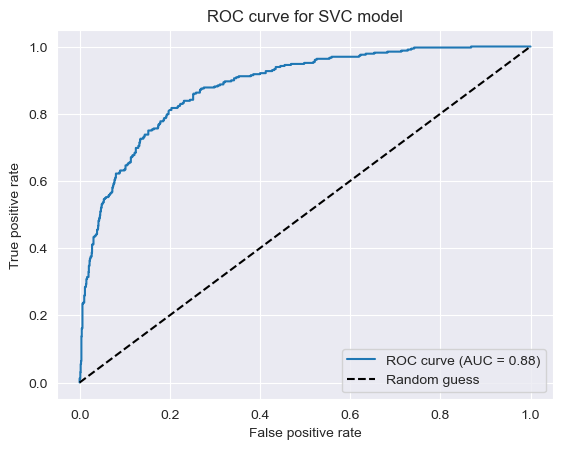

In [130]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Initialize the DecisionTreeClassifier model
gbc= GradientBoostingClassifier()

# Train the model on the training data
gbc.fit(X_train, y_train)

# Predict probabilities for the test data
y_probs = gbc.predict_proba(X_test)[:, 1]

# Calculate the ROC curve and AUC score
fpr, tpr, thresholds = roc_curve(y_test, y_probs)
auc_score = roc_auc_score(y_test, y_probs)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], 'k--', label='Random guess')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve for SVC model')
plt.legend(loc='best')
plt.show()

In [131]:
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=21)

# Initialize the Decision Tree Classifier model
gbc= GradientBoostingClassifier()

# Fit the model on the training set
gbc.fit(X_train, y_train)

# Predict probabilities of the positive class (y=1) on the testing set
y_prob = gbc.predict_proba(X_test)[:, 1]

# Calculate the False Positive Rate (fpr), True Positive Rate (tpr), and Thresholds using roc_curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# Calculate the Area Under the Curve (AUC) using auc
auc_score = auc(fpr, tpr)

# Print the AUC score
print("AUC-ROC score for SVC model: {:.3f}".format(auc_score))

AUC-ROC score for SVC model: 0.882


Here we have plotted AUC-ROC curve and found AUC score is 88.2%

# Save The model

In [132]:
# Saving model for the prediction of unseen data using joblib

joblib.dump(gbc, 'RainTomorrow_model.joblib')

['RainTomorrow_model.joblib']

# Regression Task

# Target and Independent Variable for "Rainfall"

In [133]:
# Define Target and Independent Variable

y = df['Rainfall']
X = df.drop('Rainfall', axis=1)

print("Target variable name: ", y.name)
print("Target variable dimensions: ", y.shape)

print("\nFeatures variables names: ", list(X.columns))
print("Features variables dimensions: ", X.shape)

Target variable name:  Rainfall
Target variable dimensions:  (7974,)

Features variables names:  ['MinTemp', 'MaxTemp', 'WindGustDir', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow']
Features variables dimensions:  (7974, 16)


# Feature Selection

In [134]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

y = df['Rainfall']
X = df.drop('Rainfall', axis=1)

# Initialize the model
model= LinearRegression()

# Initialize the RFE selector with model
rfe= RFE(model, n_features_to_select=5)

# Fit the selctor on data
rfe.fit(X,y)

# Get the selected features
selected_features = X.columns[rfe.support_]

# Print the features
print(selected_features)

Index(['MinTemp', 'Pressure9am', 'Temp9am', 'RainToday', 'RainTomorrow'], dtype='object')


In [135]:
fit_score = rfe.ranking_
print(fit_score)
# Get the column names of all features
all_columns = X.columns
feature_rankings = pd.DataFrame({'Feature': all_columns, 'Ranking': fit_score})

# Sort the features based on their rankings (lower rank indicates higher importance)
feature_rankings = feature_rankings.sort_values('Ranking')

print(feature_rankings)

[ 1  3  6 10 12  8  4  9  1  2 11  5  1  7  1  1]
          Feature  Ranking
0         MinTemp        1
8     Pressure9am        1
12        Temp9am        1
14      RainToday        1
15   RainTomorrow        1
9     Pressure3pm        2
1         MaxTemp        3
6     Humidity9am        4
11       Cloud3pm        5
2     WindGustDir        6
13        Temp3pm        7
5    WindSpeed3pm        8
7     Humidity3pm        9
3   WindGustSpeed       10
10       Cloud9am       11
4    WindSpeed9am       12


In [136]:
X= X.drop(['WindSpeed9am', 'Cloud9am'], axis=1)

# Feature Scaling

In [137]:
from sklearn.preprocessing import MinMaxScaler

# Initialize scaler
scaler = MinMaxScaler()

# Apply to all columns
X_scaled = scaler.fit_transform(X)

# Create a new dataframe with the scaled features
X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)
print(X_scaled_df)

       MinTemp   MaxTemp  WindGustDir  WindGustSpeed  WindSpeed3pm  \
0     0.529070  0.407035     0.866667       0.510638      0.645161   
1     0.180233  0.517588     0.933333       0.510638      0.580645   
2     0.500000  0.547739     1.000000       0.553191      0.709677   
3     0.284884  0.663317     0.266667       0.085106      0.161290   
4     0.767442  0.879397     0.866667       0.446809      0.516129   
...        ...       ...          ...            ...           ...   
7969  0.000000  0.432161     0.000000       0.234043      0.225806   
7970  0.000000  0.527638     0.400000       0.042553      0.161290   
7971  0.063953  0.608040     0.200000       0.361702      0.161290   
7972  0.203488  0.613065     0.600000       0.170213      0.096774   
7973  0.616279  0.455275     0.200000       0.429244      0.419355   

      Humidity9am  Humidity3pm  Pressure9am  Pressure3pm  Cloud3pm   Temp9am  \
0        0.571429     0.016129     0.028571     0.105769  0.500455  0.459016   

# Variance Inflation Factor(VIF)

In [138]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm

# add a constant column to features
X_scaled_df = sm.add_constant(X_scaled_df)

# Calculate VIF for each feature
vif = pd.DataFrame()
vif["X"] = X_scaled_df.columns
vif["VIF"] = [variance_inflation_factor(X_scaled_df.values, i) for i in range(X_scaled_df.shape[1])]

# Print the VIF dataframe
print(vif)

                X        VIF
0           const  46.153655
1         MinTemp   6.813629
2         MaxTemp  25.348376
3     WindGustDir   1.207131
4   WindGustSpeed   2.188958
5    WindSpeed3pm   1.856246
6     Humidity9am   3.091122
7     Humidity3pm   4.777114
8     Pressure9am  18.319018
9     Pressure3pm  17.853867
10       Cloud3pm   1.336940
11        Temp9am  15.190365
12        Temp3pm  30.681860
13      RainToday   1.278103
14   RainTomorrow   1.368512


In [139]:
X_scaled = X_scaled_df.drop(['Temp3pm', 'MaxTemp', 'Pressure3pm'], axis=1)

In [140]:
X_scaled['const']=1

# Calculate VIF for each feature
vif = pd.DataFrame()
vif["X"] = X_scaled.columns
vif["VIF"] = [variance_inflation_factor(X_scaled.values, i) for i in range(X_scaled.shape[1])]

# Print the VIF dataframe
print(vif)

                X        VIF
0           const  40.835194
1         MinTemp   6.568340
2     WindGustDir   1.123638
3   WindGustSpeed   2.171003
4    WindSpeed3pm   1.812489
5     Humidity9am   2.302413
6     Humidity3pm   2.040812
7     Pressure9am   1.490770
8        Cloud3pm   1.324853
9         Temp9am   7.341374
10      RainToday   1.234399
11   RainTomorrow   1.356421


All vif are handled.

# Best Random State

In [141]:
# Lets find the best random state

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score

# Split the data into training and testing sets using different random states
best_random_state = None
best_r2_score = -1

for random_state in range(100):
    X_train, X_test, y_train, y_test = train_test_split(df.drop('Rainfall', axis=1), df['Rainfall'], test_size=0.2, random_state=random_state)
    
    # Fit the linear regression model
    model = RandomForestRegressor()
    model.fit(X_train, y_train)
    
    # Evaluate the model on the test set
    y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    
    # Check if this random state gives a better R2 score
    if r2 > best_r2_score:
        best_r2_score = r2
        best_random_state = random_state

print("Best random state:", best_random_state)
print("Best R^2 score:", best_r2_score)

Best random state: 27
Best R^2 score: 0.8085260654469313


Here, we find the Best R^2 score is 0.8085260654469313 at best random state 27.

# Split The Data

In [142]:
# Let's split the data into test and train

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=27)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(6379, 12)
(1595, 12)
(6379,)
(1595,)


# Modelling

Regression algorithm:

Now we will be start modelling process which involve the train the model on training dataset and make it ready for testing or prediction phase. For modelling we will be using regression algorithm as this is the regression problem, where we have to predict the number of wins(continous).

We will be using different algorithms to check which one is performing best on both testing and test data depends on this specific dataset and make it ready for making prediction on unseen data. Algorithms will be used in this problems are: Linear Regression, Lasso, Ridge, and ElasticNet will be importing from sklearn.linear_model DecisionTree Regression will be importing from sklearn.tree RandomForest Regression, and GradientBoost Regression will be importing from sklearn.ensemble. We will be train our model on each algorithms and will be evaluating the R2 score for test data and train data, Mean absolute error(MAE), Mean square error(MSE), and Root mean square error(RMSE) to check the accuracy and performance. On this basis we will first find out which one will be performing well, then further for more accuracy we will be finding out cross validation score and will find out the difference between the R2 score and mean cv score, lesser the difference accurate the performance, and finally we will be using hyperparameter tuning to hypertune the best three performing model base on lesser difference to check their performance. At last we will be saving that model for future prediction on unseen data.

We will be importing cross_val_score from sklearn.models_selection

# Linear Regression

In [143]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Initialize the linear regression model and fit the training data
lr = LinearRegression()
lr.fit(X_train, y_train)

# Make predictions on the test data
y_pred = lr.predict(X_test)

# Calculate the evaluation metrics
r2_test = r2_score(y_test, y_pred)
r2_train = r2_score(y_train, lr.predict(X_train))
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

# Print the evaluation metrics
print("Root squared on test data:", np.sqrt(r2_test))
print("MAE:", mae)
print("MSE:", mse)
print("Root mean square error:", rmse)
print("Root squared on training data:", np.sqrt(r2_train))

Root squared on test data: 0.8244549486530501
MAE: 0.3549532920172869
MSE: 0.26208120123166834
Root mean square error: 0.5119386694045179
Root squared on training data: 0.8035164886195738


Here we can see the performance of model is well on both test and train data as R2 for test data is 82.4% and for train data is 80.3%

# Lasso(L1) Regression

In [144]:
# Initialize the Lasso Regression model and fit the training data
lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)

# Make predictions using the trained model on both train and test data
y_train_pred = lasso.predict(X_train)
y_test_pred = lasso.predict(X_test)

# Calculate R-squared for train and test data 
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

# Calculate mean absolute error for test data
mae_test = mean_absolute_error(y_test, y_test_pred)

# Calculate mean squared error for test data
mse_test = mean_squared_error(y_test, y_test_pred)

# Calculate root mean squared error for test data
rmse_test = np.sqrt(mse_test)

print("Root squared on test data:", r2_test)
print("MAE on test data:", mae_test)
print("MSE on test data:", mse_test)
print("RMSE on test data:", rmse_test)
print("Root squared on training data:", r2_train)

Root squared on test data: 0.5574651095989072
MAE on test data: 0.5309569825325273
MSE on test data: 0.36212762207427857
RMSE on test data: 0.6017704064460785
Root squared on training data: 0.5312021929630543


Here we can see the performance of model is quite ok on both test and train data as R2 for test data is 55.7% and for train data is 53.1%

# Ridge(L2) Regression

In [145]:
# Initialize the Ridge Regression model and fit the training data 
ridge = Ridge(alpha=0.1)
ridge.fit(X_train, y_train)

# Make prediction on both test and train data
y_test_pred = ridge.predict(X_test)
y_train_pred = ridge.predict(X_train)

# Calculate R-squared for train and test data 
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

# Calculate mean absolute error, mean squared error, and root mean squared error for test data
mae_test = mean_absolute_error(y_test, y_test_pred)
mse_test = mean_squared_error(y_test, y_test_pred)
rmse_test = np.sqrt(mse_test)

print("Root squared on test data:", r2_test)
print("MAE on test data:", mae_test)
print("MSE on test data:", mse_test)
print("RMSE on test data:", rmse_test)
print("Root squared on training data:", r2_train)

Root squared on test data: 0.6797236585113287
MAE on test data: 0.35496150430451373
MSE on test data: 0.2620830864766901
RMSE on test data: 0.5119405106813585
Root squared on training data: 0.6456387271014246


Here we can see the performance of model is quite ok on both test and train data as R2 for test data is 67.9% and for train data is 64.5%

# ElasticNet

In [146]:
# Initialize the Elastic Net Regression model and fit the training data
elastic_net = ElasticNet(alpha=0.01, l1_ratio=0.5)
elastic_net.fit(X_train, y_train)

# Make predictions using the trained model on both train and test data
y_train_pred = elastic_net.predict(X_train)
y_test_pred = elastic_net.predict(X_test)

# Calculate R-squared for train and test data 
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

# Calculate mean absolute error, mean squared error, and root mean squared error for test data
mae_test = mean_absolute_error(y_test, y_test_pred)
mse_test = mean_squared_error(y_test, y_test_pred)
rmse_test = np.sqrt(mse_test)

print("Root squared on test data:", r2_test)
print("MAE on test data:", mae_test)
print("MSE on test data:", mse_test)
print("RMSE on test data:", rmse_test)
print("Root squared on training data:", r2_train)

Root squared on test data: 0.6733400699679791
MAE on test data: 0.3649787431747861
MSE on test data: 0.26730679604094293
RMSE on test data: 0.5170172105848537
Root squared on training data: 0.6392818397638543


Here we can see the performance of model is quite ok on both test and train data as R2 for test data is 67.3% and for train data is 63.9%

# DecisionTreeRegression(DTR)

In [147]:
# Initialize the Decision Tree Regression model and fit the training data
dtr_model = DecisionTreeRegressor()
dtr_model.fit(X_train, y_train)

# Make predictions using the trained model on both train and test data
y_train_pred = dtr_model.predict(X_train)
y_test_pred = dtr_model.predict(X_test)

# Calculate R-squared for train and test data 
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

# Calculate mean absolute error, mean squared error, and root mean squared error for test data
mae_test = mean_absolute_error(y_test, y_test_pred)
mse_test = mean_squared_error(y_test, y_test_pred)
rmse_test = np.sqrt(mse_test)

print("Root squared on test data:", r2_test)
print("MAE on test data:", mae_test)
print("MSE on test data:", mse_test)
print("RMSE on test data:", rmse_test)
print("Root squared on training data:", r2_train)

Root squared on test data: 0.6460684041988684
MAE on test data: 0.1992225536741512
MSE on test data: 0.28962328156374906
RMSE on test data: 0.5381665927607817
Root squared on training data: 0.9971269011272423


Here we can see model is overfitted as it is performing excellent in train data but average on test data i.e., R2 for test data is 64.6% and train data is 99.7% 

# RandomForestRegressor(RFR)

In [148]:
# Initialize the Random Forest Regression model and fit the training data
rf = RandomForestRegressor(n_estimators=100, random_state=27)
rf.fit(X_train, y_train)

# Make predictions using the trained model on both train and test data
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

# Calculate R-squared for train and test data 
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

# Calculate mean absolute error, mean squared error, and root mean squared error for test data
mae_test = mean_absolute_error(y_test, y_test_pred)
mse_test = mean_squared_error(y_test, y_test_pred)
rmse_test = np.sqrt(mse_test)

print("Root squared on test data:", r2_test)
print("MAE on test data:", mae_test)
print("MSE on test data:", mse_test)
print("RMSE on test data:", rmse_test)
print("Root squared on training data:", r2_train)

Root squared on test data: 0.8029732168317283
MAE on test data: 0.24716872443749116
MSE on test data: 0.16122760492173505
RMSE on test data: 0.40153157400350853
Root squared on training data: 0.9662457845380492


Here too we can see model is overfitted as it is performing excellent on train data but well on test data as R2 for test data is 80.2% and for train data is 96.6%

# GradientBoostingRegression(GBR)

In [149]:
# Initialize the Gradient Boosting Regression model and fit the training data
gbr = GradientBoostingRegressor(n_estimators=100, max_depth=3, random_state=27)
gbr.fit(X_train, y_train)

# Make predictions using the trained model on both train and test data
y_train_pred = gbr.predict(X_train)
y_test_pred = gbr.predict(X_test)


# Calculate R-squared for train and test data 
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

# Calculate mean absolute error, mean squared error, and root mean squared error for test data
mae_test = mean_absolute_error(y_test, y_test_pred)
mse_test = mean_squared_error(y_test, y_test_pred)
rmse_test = np.sqrt(mse_test)

print("Root squared on test data:", r2_test)
print("MAE on test data:", mae_test)
print("MSE on test data:", mse_test)
print("RMSE on test data:", rmse_test)
print("Root squared on training data:", r2_train)

Root squared on test data: 0.7088478535289275
MAE on test data: 0.3257120741553855
MSE on test data: 0.23825067073882214
RMSE on test data: 0.4881092815536518
Root squared on training data: 0.7004072742747288


Here we can see model is performing well on both test and train data, as R2 score for test data is 70.8% and for train data is 70%

# KNeighborsRegression(KNN)

In [151]:
# Initialize the KNeighbors Regression model and fit the training data
knr = KNeighborsRegressor(n_neighbors=5)
knr.fit(X_train, y_train)

# Make predictions using the trained model on both train and test data
y_train_pred = knr.predict(X_train)
y_test_pred = knr.predict(X_test)


# Calculate R-squared for train and test data 
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

# Calculate mean absolute error, mean squared error, and root mean squared error for test data
mae_test = mean_absolute_error(y_test, y_test_pred)
mse_test = mean_squared_error(y_test, y_test_pred)
rmse_test = np.sqrt(mse_test)

print("Root squared on test data:", r2_test)
print("MAE on test data:", mae_test)
print("MSE on test data:", mse_test)
print("RMSE on test data:", rmse_test)
print("Root squared on training data:", r2_train)

Root squared on test data: 0.6757024952831348
MAE on test data: 0.29281733542989047
MSE on test data: 0.2653736163521504
RMSE on test data: 0.5151442675136261
Root squared on training data: 0.7609924282550486


Here too we can see model is overfitted as it is performing well on train data but quite average on test data as R2 for test data is 67.5% and for train data is 76%

# SupportVectorRegression(SVR)

In [152]:
from sklearn.svm import SVR

# Initialize an SVR model with a linear kernel
svr = SVR(kernel='linear')
svr.fit(X_train, y_train)

# Make predictions using the trained model on both train and test data
y_train_pred = svr.predict(X_train)
y_test_pred = svr.predict(X_test)


# Calculate R-squared for train and test data 
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

# Calculate mean absolute error, mean squared error, and root mean squared error for test data
mae_test = mean_absolute_error(y_test, y_test_pred)
mse_test = mean_squared_error(y_test, y_test_pred)
rmse_test = np.sqrt(mse_test)

print("Root squared on test data:", r2_test)
print("MAE on test data:", mae_test)
print("MSE on test data:", mse_test)
print("RMSE on test data:", rmse_test)
print("Root squared on training data:", r2_train)

Root squared on test data: 0.6206563658967059
MAE on test data: 0.2752982339281669
MSE on test data: 0.31041802837813465
RMSE on test data: 0.5571517103789009
Root squared on training data: 0.5766316597861101


Here we can see model is performing quite average on both test and train data, as R2 score for test data is 62% and for train data is 57.6%

# XGBoost Regression

In [153]:
import xgboost as xgb

# Initialize the XGBoost Regression model and fit the training data
xgb = xgb.XGBRegressor(n_estimators=100, learning_rate=0.05)
xgb.fit(X_train, y_train)

# Make predictions using the trained model on both train and test data
y_train_pred = xgb.predict(X_train)
y_test_pred = xgb.predict(X_test)

# Calculate R-squared for train and test data 
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)

# Calculate mean absolute error, mean squared error, and root mean squared error for test data
mae_test = mean_absolute_error(y_test, y_test_pred)
mse_test = mean_squared_error(y_test, y_test_pred)
rmse_test = np.sqrt(mse_test)

print("Root squared on test data:", r2_test)
print("MAE on test data:", mae_test)
print("MSE on test data:", mse_test)
print("RMSE on test data:", rmse_test)
print("Root squared on training data:", r2_train)

Root squared on test data: 0.7362740189039527
MAE on test data: 0.3006320009836344
MSE on test data: 0.2158077577272129
RMSE on test data: 0.4645511357506436
Root squared on training data: 0.7749593935342552


Here too we can see model is overfitted as it is performing well on train data but slight less well on test data as R2 for test data is 73.6% and for train data is 77.4%

Here we can see LinearRegression, and GradientBoostingRegression is performing well on both test and train data,while  L1, L2, ElasticNet, and SupportVector regression perform quite average on both training and testing data, among them linear regression performed best, and rest other models shows overfitting ,as they are performing good on trainig data but less on test data.

Till here Linear Regression is the best performing and more fitted model. But as we have seen the overfitting conditions here with few models we will perform CV score method to check accuracy.

let's check CV score for more accuracy

# Cross Validation Score(CV Score)

# LR CV Score

In [154]:
# Initialize the linear regression model and fit the training data
lr = LinearRegression()

# Perform cross-validation on the model
cv_scores = cross_val_score(lr, X, y, cv=5, scoring='r2')

# Print the mean and standard deviation of the cross-validation scores
print("Cross-Validation Scores: ", cv_scores)
print("Mean of CV Scores: ", cv_scores.mean())

# Fit the model on the training data
lr.fit(X_train, y_train)

# Make predictions on the test data
y_pred = lr.predict(X_test)

# Calculate the difference between the R2 score and mean CV score
diff = r2_score(y_test, y_pred) - cv_scores.mean()

# Print the difference
print("Difference between R2 score and mean CV score: ",(diff))

Cross-Validation Scores:  [0.73858942 0.58365964 0.61857847 0.5579922  0.75840486]
Mean of CV Scores:  0.6514449181080201
Difference between R2 score and mean CV score:  0.02828104425048339


# L1 CV Score

In [155]:
# Initialize the Lasso model
lasso = Lasso()

# Perform cross-validation on the model
cv_scores = cross_val_score(lasso, X, y, cv=5, scoring='r2')

# Print the mean and standard deviation of the cross-validation scores
print("Cross-Validation Scores: ", cv_scores)
print("Mean of CV Scores: ", cv_scores.mean())

# Fit the model on the training data
lasso.fit(X_train, y_train)

# Make predictions on the test data
y_pred = lasso.predict(X_test)

# Calculate the difference between the R2 score and mean CV score
diff = r2_score(y_test, y_pred) - cv_scores.mean()

# Print the difference
print("Difference between R2 score and mean CV score: ",(diff))

Cross-Validation Scores:  [0.19409359 0.1462987  0.11372466 0.13416418 0.26927241]
Mean of CV Scores:  0.1715107058193127
Difference between R2 score and mean CV score:  -0.17152709272926878


# L2 CV Score

In [156]:
# Initialize the Ridge regression model and fit the training data
ridge = Ridge(alpha=0.01)
ridge.fit(X_train, y_train)

# Perform cross-validation on the model
cv_scores = cross_val_score(ridge, X, y, cv=5, scoring='r2')

# Print the mean and standard deviation of the cross-validation scores
print("Cross-Validation Scores: ", cv_scores)
print("Mean of CV Scores: ", cv_scores.mean())

# Make predictions on the test data
y_pred = ridge.predict(X_test)

# Calculate the difference between the R2 score and mean CV score
diff = r2_score(y_test, y_pred) - cv_scores.mean()

# Print the difference
print("Difference between R2 score and mean CV score: ", diff)

Cross-Validation Scores:  [0.7385888  0.58366017 0.61857763 0.55799373 0.75840437]
Mean of CV Scores:  0.6514449398815503
Difference between R2 score and mean CV score:  0.028280793814937644


# ElasticNet CV Score

In [157]:
# Initialize the ElasticNet regression model and fit the training data
enet = ElasticNet(alpha=0.01, l1_ratio=0.5)
enet.fit(X_train, y_train)

# Perform cross-validation on the model
cv_scores = cross_val_score(enet, X, y, cv=5, scoring='r2')

# Print the mean and standard deviation of the cross-validation scores
print("Cross-Validation Scores: ", cv_scores)
print("Mean of CV Scores: ", cv_scores.mean())

# Make predictions on the test data
y_pred = enet.predict(X_test)

# Calculate the difference between the R2 score and mean CV score
diff = r2_score(y_test, y_pred) - cv_scores.mean()

# Print the difference
print("Difference between R2 score and mean CV score: ", diff)

Cross-Validation Scores:  [0.73397004 0.58548974 0.61338824 0.56137941 0.75455409]
Mean of CV Scores:  0.6497563013893577
Difference between R2 score and mean CV score:  0.023583768578621433


# DTR CV Score

In [158]:
# Initialize the decision tree regression model with max depth 5
dtr = DecisionTreeRegressor(max_depth=5)

# Perform cross-validation on the model
cv_scores = cross_val_score(dtr, X, y, cv=5, scoring='r2')

# Print the mean and standard deviation of the cross-validation scores
print("Cross-Validation Scores: ", cv_scores)
print("Mean of CV Scores: ", cv_scores.mean())

# Fit the model on the training data
dtr.fit(X_train, y_train)

# Make predictions on the test data
y_pred = dtr.predict(X_test)

# Calculate the difference between the R2 score and mean CV score
diff = r2_score(y_test, y_pred) - cv_scores.mean()

# Print the difference
print("Difference between R2 score and mean CV score: ", diff)

Cross-Validation Scores:  [0.7038892  0.58753919 0.60126499 0.53515676 0.75121371]
Mean of CV Scores:  0.6358127671914419
Difference between R2 score and mean CV score:  0.05705894442899495


# RFR CV Score

In [160]:
# Initialize the random forest regression model and fit the training data
rf = RandomForestRegressor(n_estimators=100, random_state=27)
rf.fit(X_train, y_train)

# Perform cross-validation on the model
cv_scores = cross_val_score(rf, X, y, cv=5, scoring='r2')

# Print the mean and standard deviation of the cross-validation scores
print("Cross-Validation Scores: ", cv_scores)
print("Mean of CV Scores: ", cv_scores.mean())

# Make predictions on the test data
y_pred = rf.predict(X_test)

# Calculate the difference between the R2 score and mean CV score
diff = r2_score(y_test, y_pred) - cv_scores.mean()

# Print the difference
print("Difference between R2 score and mean CV score: ", diff)

Cross-Validation Scores:  [0.69764185 0.72504683 0.80285339 0.64140308 0.68891834]
Mean of CV Scores:  0.7111726964112155
Difference between R2 score and mean CV score:  0.09180052042051279


# GBR CV Score

In [161]:
# Initialize the Gradient Boosting Regression model with default parameters
gbr = GradientBoostingRegressor()

# Perform cross-validation on the model
cv_scores = cross_val_score(gbr, X, y, cv=5, scoring='r2')

# Print the mean and standard deviation of the cross-validation scores
print("Cross-Validation Scores: ", cv_scores)
print("Mean of CV Scores: ", cv_scores.mean())

# Fit the model on the training data
gbr.fit(X_train, y_train)

# Make predictions on the test data
y_pred = gbr.predict(X_test)

# Calculate the difference between the R2 score and mean CV score
diff = r2_score(y_test, y_pred) - cv_scores.mean()

# Print the difference
print("Difference between R2 score and mean CV score: ", diff)

Cross-Validation Scores:  [0.73363832 0.61409616 0.6392353  0.56812132 0.7640958 ]
Mean of CV Scores:  0.6638373789506506
Difference between R2 score and mean CV score:  0.04501047457827689


# KNR CV Score

In [162]:
# Initialize a KNeighbors Regressor model
knr = KNeighborsRegressor(n_neighbors=5)

# Perform cross-validation on the model
cv_scores = cross_val_score(knr, X, y, cv=5, scoring='r2')

# Print the mean and standard deviation of the cross-validation scores
print("Cross-Validation Scores: ", cv_scores)
print("Mean of CV Scores: ", cv_scores.mean())

# Fit the model on the training data
knr.fit(X_train, y_train)

# Make predictions on the test data
y_pred = knr.predict(X_test)

# Calculate the difference between the R2 score and mean CV score
diff = r2_score(y_test, y_pred) - cv_scores.mean()

# Print the difference
print("Difference between R2 score and mean CV score: ", diff)

Cross-Validation Scores:  [0.07835392 0.17945576 0.20568136 0.14884747 0.08330018]
Mean of CV Scores:  0.13912773842292386
Difference between R2 score and mean CV score:  0.5365747568602108


# SVR CV Score

In [163]:
# Initializes the Support Vector Regressor model
svr= SVR()

# Perform cross-validation on the model
cv_scores = cross_val_score(svr, X, y, cv=5, scoring='r2')

# Print the mean and standard deviation of the cross-validation scores
print("Cross-Validation Scores: ", cv_scores)
print("Mean of CV Scores: ", cv_scores.mean())

# Fit the model on the training data
svr.fit(X_train, y_train)

# Make predictions on the test data
y_pred = svr.predict(X_test)

# Calculate the difference between the R2 score and mean CV score
diff = r2_score(y_test, y_pred) - cv_scores.mean()

# Print the difference
print("Difference between R2 score and mean CV score: ", diff)

Cross-Validation Scores:  [-0.09260821 -0.27395908 -0.16520243 -0.31228469  0.00216588]
Mean of CV Scores:  -0.16837770500129706
Difference between R2 score and mean CV score:  0.8374174934662033


# XGB CV Score

In [166]:
import xgboost as xgb
# Initialize the XGBoost Regressor model
xgb = xgb.XGBRegressor(n_estimators=100, learning_rate=0.05)

# Perform cross-validation on the model
cv_scores = cross_val_score(xgb, X, y, cv=5, scoring='r2')

# Print the mean and standard deviation of the cross-validation scores
print("Cross-Validation Scores: ", cv_scores)
print("Mean of CV Scores: ", cv_scores.mean())

# Fit the model on the training data
xgb.fit(X_train, y_train)

# Make predictions on the test data
y_pred = xgb.predict(X_test)

# Calculate the difference between the R2 score and mean CV score
diff = r2_score(y_test, y_pred) - cv_scores.mean()

# Print the difference
print("Difference between R2 score and mean CV score: ", diff)

Cross-Validation Scores:  [0.72806049 0.6382535  0.68273341 0.59021419 0.74650539]
Mean of CV Scores:  0.6771533963015701
Difference between R2 score and mean CV score:  0.0591206226023826


Based on the difference between R2 score and mean CV score , we can see that the ElasticNetRegressor is the best performing model in this case although it is performing quite average on train and test data but, smaller the difference, the better the model's generalization performance.

ElasticNet Regression is the best fitted and performing model with least difference.

Now we will perform hyperparametertuning for more accuracy to the few best model according to their difference to check their performance more accurately.

# Hyperparameter Tuning

Randomized SearchCV 

Here in this step we will be using the RandomizedSearchCV technique for performing hyperparameter tuning.

Hyperparameters are those parameters which are not learned from the data but predefined when the learning process begins. They basically controls the behaviour of the learning algorithm and shows the significant impact on the performance of the model.

RandomizedSearch CV: It automates the process of hyperparameter tuning by randomly sampling a defined number of hyperparameter combinations from a given parameter distribution. It evaluates the model's performance for each sampled combination and identifies the best set of hyperparameters that optimize a specified evaluation metric, such as accuracy or mean squared error.

Advantages of RandomizedSearchCV: Avoidance of Overfitting, Efficient Search Space Exploration, Time-saving, and Flexibility.

RandomizedSearchCV is a powerful technique for hyperparameter tuning that balances exploration of the search space with computational efficiency, helping you find a good set of hyperparameters for your model.

# ElasticNet

In [167]:
from scipy.stats import uniform

param_dist = {'alpha': [0.01, 0.1, 1],
                 'max_iter': [20, 100, 500, 1000],
                  'l1_ratio': [0.25, 0.5, 0.75],
                 'fit_intercept': [True, False],
                 'selection': ['cyclic', 'random']}

elastic_net = ElasticNet()

# Create the randomized search CV object
elastic_net_random = RandomizedSearchCV(elastic_net, param_distributions=param_dist, cv=5, n_iter=100, random_state=27)

# Fit the randomized search CV object on the data
elastic_net_random.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters:", elastic_net_random.best_params_)
print("Best score:", elastic_net_random.best_score_)

Best parameters: {'selection': 'random', 'max_iter': 1000, 'l1_ratio': 0.25, 'fit_intercept': True, 'alpha': 0.01}
Best score: 0.6398898893420908


# L2 Regressor

In [168]:
from scipy.stats import uniform

param_dist = {'alpha': [0.01, 0.1, 1],
                 'max_iter': [20, 100, 500, 1000],
                 'fit_intercept': [True, False],
                 'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga']}

ridge = Ridge()

# Create the randomized search CV object
ridge_random = RandomizedSearchCV(ridge, param_distributions=param_dist, cv=5, n_iter=100, random_state=27)

# Fit the randomized search CV object on the data
ridge_random.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters:", ridge_random.best_params_)
print("Best score:", ridge_random.best_score_)

Best parameters: {'solver': 'sag', 'max_iter': 20, 'fit_intercept': True, 'alpha': 0.01}
Best score: 0.6440081868892186


# Linear Regression

In [169]:
lr= LinearRegression()
param_dist = {'n_jobs': [-1, 1, 2],
             'fit_intercept': [True, False]}


# Create the randomized search CV object
lr_random = RandomizedSearchCV(lr, param_distributions=param_dist, cv=5, n_iter=100, random_state=27)

# Fit the randomized search CV object on the data
lr_random.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters:", lr_random.best_params_)
print("Best score:", lr_random.best_score_)

Best parameters: {'n_jobs': -1, 'fit_intercept': True}
Best score: 0.643892347885707


# GBRegression

In [170]:
from scipy.stats import randint

param_dist = {'n_estimators': randint(100, 300),
              'learning_rate': uniform(0.01, 0.5),
              'max_depth': [3, 5, 7],
              'min_samples_split': randint(2, 10)}
gbr = GradientBoostingRegressor()

# Create the randomized search CV object
gbr_random = RandomizedSearchCV(gbr, param_distributions=param_dist, cv=5, n_iter=100, random_state=27)

# Fit the randomized search CV object on the data
gbr_random.fit(X_train, y_train)

# Print the best parameters and best score
print("Best parameters:", gbr_random.best_params_)
print("Best score:", gbr_random.best_score_)

Best parameters: {'learning_rate': 0.10646609242079218, 'max_depth': 7, 'min_samples_split': 7, 'n_estimators': 205}
Best score: 0.7419962824739258


After performing hyperparameter tuning on the few best models according to least CV Score, It is concluded that GradientBoostionRegression shows improvement and perfom well on test data, as earlier it was 70.8%, now its increases to 74.1%.

So, GradientBoostingRegression is the best suited and performing model.

Save the model for Future prediction.

# Save The Model

In [171]:
# Saving model for the prediction of unseen data

import joblib

# Save the model using joblib
joblib.dump(gbr, 'Rainfall_model.joblib')

['Rainfall_model.joblib']